<img src="http://imgur.com/1ZcRyrc.png" style="float: left; margin: 15px; height: 80px">

# Project 2

### Exploratory Data Analysis (EDA)

---

Your hometown mayor just created a new data analysis team to give policy advice, and the administration recruited _you_ via LinkedIn to join it. Unfortunately, due to budget constraints, for now the "team" is just you...

The mayor wants to start a new initiative to move the needle on one of two separate issues: high school education outcomes, or drug abuse in the community.

Also unfortunately, that is the entirety of what you've been told. And the mayor just went on a lobbyist-funded fact-finding trip in the Bahamas. In the meantime, you got your hands on two national datasets: one on SAT scores by state, and one on drug use by age. Start exploring these to look for useful patterns and possible hypotheses!

---

This project is focused on exploratory data analysis, aka "EDA". EDA is an essential part of the data science analysis pipeline. Failure to perform EDA before modeling is almost guaranteed to lead to bad models and faulty conclusions. What you do in this project are good practices for all projects going forward, especially those after this bootcamp!

This lab includes a variety of plotting problems. Much of the plotting code will be left up to you to find either in the lecture notes, or if not there, online. There are massive amounts of code snippets either in documentation or sites like [Stack Overflow](https://stackoverflow.com/search?q=%5Bpython%5D+seaborn) that have almost certainly done what you are trying to do.

**Get used to googling for code!** You will use it every single day as a data scientist, especially for visualization and plotting.

#### Package imports

In [1]:
import numpy as np
import scipy.stats as stats
import csv
import pandas as pd

# this line tells jupyter notebook to put the plots in the notebook rather than saving them to file.
%matplotlib inline

# this line makes plots prettier on mac retina screens. If you don't have one it shouldn't do anything.
%config InlineBackend.figure_format = 'retina'

<img src="http://imgur.com/l5NasQj.png" style="float: left; margin: 25px 15px 0px 0px; height: 25px">

## 1. Load the `sat_scores.csv` dataset and describe it

---

You should replace the placeholder path to the `sat_scores.csv` dataset below with your specific path to the file.

### 1.1 Load the file with the `csv` module and put it in a Python dictionary

The dictionary format for data will be the column names as key, and the data under each column as the values.

Toy example:
```python
data = {
    'column1':[0,1,2,3],
    'column2':['a','b','c','d']
    }
```

In [2]:
# for loop method 
sat_scores = []
with open('./sat_scores.csv','r') as f:
    reader = csv.reader(f)
    for row in reader:
        sat_scores.append(row)
f.close()
    

In [3]:
# List comprehensive method 
with open('./sat_scores.csv','r') as f:
    sat_scores = [row for row in csv.reader(f)]
f.close()

In [4]:
sat_scores

[['State', 'Rate', 'Verbal', 'Math'],
 ['CT', '82', '509', '510'],
 ['NJ', '81', '499', '513'],
 ['MA', '79', '511', '515'],
 ['NY', '77', '495', '505'],
 ['NH', '72', '520', '516'],
 ['RI', '71', '501', '499'],
 ['PA', '71', '500', '499'],
 ['VT', '69', '511', '506'],
 ['ME', '69', '506', '500'],
 ['VA', '68', '510', '501'],
 ['DE', '67', '501', '499'],
 ['MD', '65', '508', '510'],
 ['NC', '65', '493', '499'],
 ['GA', '63', '491', '489'],
 ['IN', '60', '499', '501'],
 ['SC', '57', '486', '488'],
 ['DC', '56', '482', '474'],
 ['OR', '55', '526', '526'],
 ['FL', '54', '498', '499'],
 ['WA', '53', '527', '527'],
 ['TX', '53', '493', '499'],
 ['HI', '52', '485', '515'],
 ['AK', '51', '514', '510'],
 ['CA', '51', '498', '517'],
 ['AZ', '34', '523', '525'],
 ['NV', '33', '509', '515'],
 ['CO', '31', '539', '542'],
 ['OH', '26', '534', '439'],
 ['MT', '23', '539', '539'],
 ['WV', '18', '527', '512'],
 ['ID', '17', '543', '542'],
 ['TN', '13', '562', '553'],
 ['NM', '13', '551', '542'],
 ['IL

### 1.2 Make a pandas DataFrame object with the SAT dictionary, and another with the pandas `.read_csv()` function

Compare the DataFrames using the `.dtypes` attribute in the DataFrame objects. What is the difference between loading from file and inputting this dictionary (if any)?

In [5]:
#header = 1st item (lists of list) in the list 
header = sat_scores[0]
#data = items (list of list) after header
data = sat_scores[1:]

#zip the header and data in a dictionary through list comprehension
sat_scores_dict = {title:[row[index] for row in data] for index,title in enumerate(header)}

sat_scores_dict


{'Math': ['510',
  '513',
  '515',
  '505',
  '516',
  '499',
  '499',
  '506',
  '500',
  '501',
  '499',
  '510',
  '499',
  '489',
  '501',
  '488',
  '474',
  '526',
  '499',
  '527',
  '499',
  '515',
  '510',
  '517',
  '525',
  '515',
  '542',
  '439',
  '539',
  '512',
  '542',
  '553',
  '542',
  '589',
  '550',
  '545',
  '572',
  '589',
  '580',
  '554',
  '568',
  '561',
  '577',
  '562',
  '596',
  '550',
  '570',
  '603',
  '582',
  '599',
  '551',
  '514'],
 'Rate': ['82',
  '81',
  '79',
  '77',
  '72',
  '71',
  '71',
  '69',
  '69',
  '68',
  '67',
  '65',
  '65',
  '63',
  '60',
  '57',
  '56',
  '55',
  '54',
  '53',
  '53',
  '52',
  '51',
  '51',
  '34',
  '33',
  '31',
  '26',
  '23',
  '18',
  '17',
  '13',
  '13',
  '12',
  '12',
  '11',
  '11',
  '9',
  '9',
  '9',
  '8',
  '8',
  '8',
  '7',
  '6',
  '6',
  '5',
  '5',
  '4',
  '4',
  '4',
  '45'],
 'State': ['CT',
  'NJ',
  'MA',
  'NY',
  'NH',
  'RI',
  'PA',
  'VT',
  'ME',
  'VA',
  'DE',
  'MD',
  'NC',

In [6]:
#covert the dictionary to dataframe format
df_sat_scores= pd.DataFrame(sat_scores_dict)

df_sat_scores.head()

,Math,Rate,State,Verbal
0,510,82,CT,509
1,513,81,NJ,499
2,515,79,MA,511
3,505,77,NY,495
4,516,72,NH,520


In [7]:
#open csv file in DataFrame format
df_sat_scores_read = pd.read_csv('./sat_scores.csv')

df_sat_scores_read.head()

,State,Rate,Verbal,Math
0,CT,82,509,510
1,NJ,81,499,513
2,MA,79,511,515
3,NY,77,495,505
4,NH,72,520,516


In [8]:
df_sat_scores.dtypes

Math      object
Rate      object
State     object
Verbal    object
dtype: object

In [9]:
df_sat_scores_read.dtypes

State     object
Rate       int64
Verbal     int64
Math       int64
dtype: object

If you did not convert the string column values to float in your dictionary, the columns in the DataFrame are of type `object` (which are string values, essentially). 

### 1.3 Look at the first ten rows of the DataFrame: what does our data describe?

From now on, use the DataFrame loaded from the file using the `.read_csv()` function.

Use the `.head(num)` built-in DataFrame function, where `num` is the number of rows to print out.

You are not given a "codebook" with this data, so you will have to make some (very minor) inference.

In [10]:
df_sat_scores_read.head(11)

,State,Rate,Verbal,Math
0,CT,82,509,510
1,NJ,81,499,513
2,MA,79,511,515
3,NY,77,495,505
4,NH,72,520,516
5,RI,71,501,499
6,PA,71,500,499
7,VT,69,511,506
8,ME,69,506,500
9,VA,68,510,501


<img src="http://imgur.com/l5NasQj.png" style="float: left; margin: 25px 15px 0px 0px; height: 25px">

## 2. Create a "data dictionary" based on the data

---

A data dictionary is an object that describes your data. This should contain the name of each variable (column), the type of the variable, your description of what the variable is, and the shape (rows and columns) of the entire dataset.

In [11]:
# create dictionary by define the shapes and the number of rows and columns and also define the names of the column
data_dictionary = {'shapes' : {'row':52,'col': 4} , 'columns' : ['State','Rate','Verbal','Math']}


data_dictionary.update(df_sat_scores_read.describe().to_dict(orient='dict'))

data_dictionary

{'Math': {'25%': 504.0,
  '50%': 521.0,
  '75%': 555.75,
  'count': 52.0,
  'max': 603.0,
  'mean': 531.5,
  'min': 439.0,
  'std': 36.01497509887448},
 'Rate': {'25%': 9.0,
  '50%': 33.5,
  '75%': 63.5,
  'count': 52.0,
  'max': 82.0,
  'mean': 37.15384615384615,
  'min': 4.0,
  'std': 27.301788072869286},
 'Verbal': {'25%': 501.0,
  '50%': 526.5,
  '75%': 562.0,
  'count': 52.0,
  'max': 593.0,
  'mean': 532.0192307692307,
  'min': 482.0,
  'std': 33.2362254437778},
 'columns': ['State', 'Rate', 'Verbal', 'Math'],
 'shapes': {'col': 4, 'row': 52}}

<img src="http://imgur.com/l5NasQj.png" style="float: left; margin: 25px 15px 0px 0px; height: 25px">

## 3. Plot the data using seaborn

---

### 3.1 Using seaborn's `distplot`, plot the distributions for each of `Rate`, `Math`, and `Verbal`

Set the keyword argument `kde=False`. This way you can actually see the counts within bins. You can adjust the number of bins to your liking. 

[Please read over the `distplot` documentation to learn about the arguments and fine-tune your chart if you want.](https://stanford.edu/~mwaskom/software/seaborn/generated/seaborn.distplot.html#seaborn.distplot)

In [12]:
import seaborn as sns
import matplotlib.pyplot as plt

%matplotlib inline 
plt.style.use('fivethirtyeight')

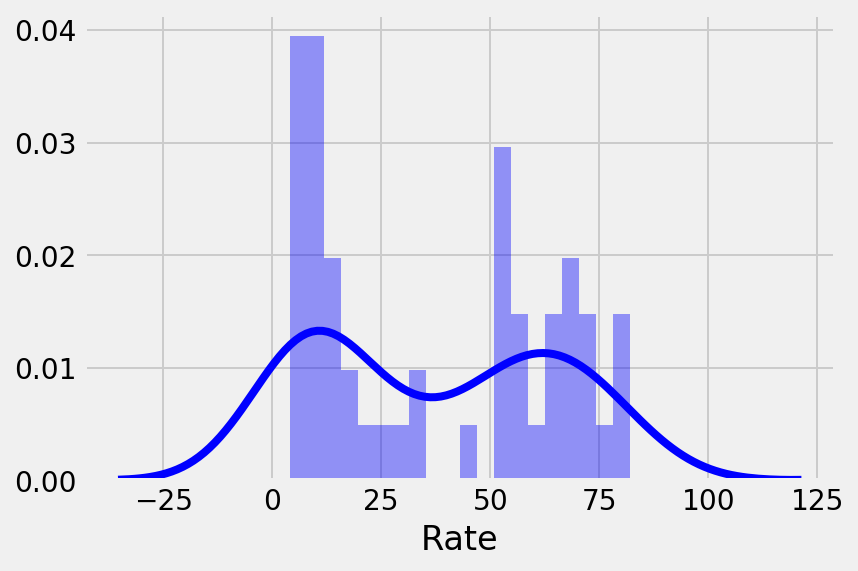

In [13]:
sns.distplot(df_sat_scores_read.Rate, color = "b", bins = 20, kde = True)

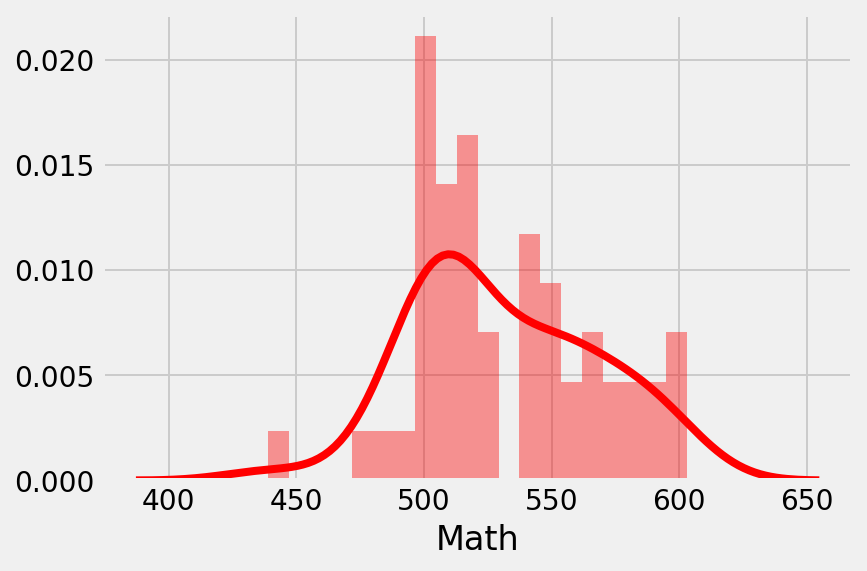

In [14]:
sns.distplot(df_sat_scores_read.Math, color="r", bins=20, kde=True)

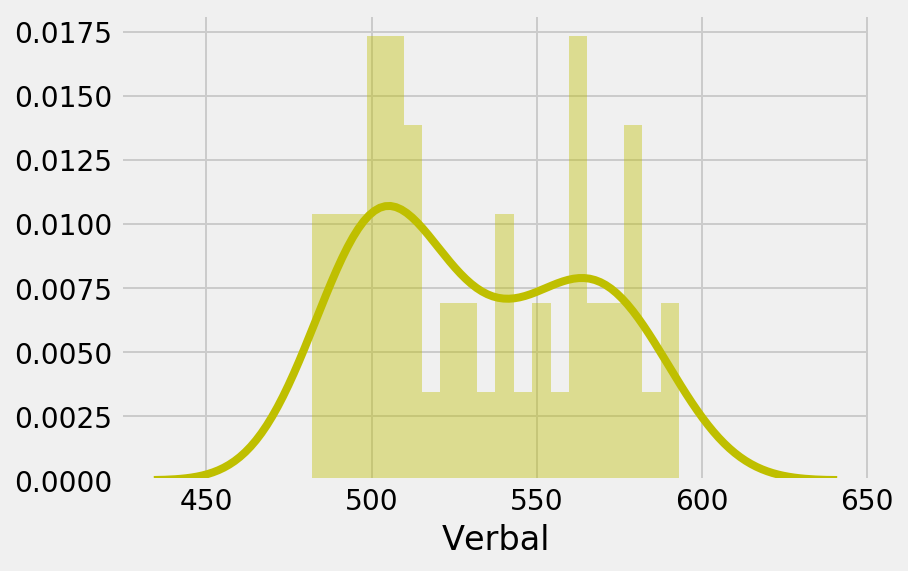

In [15]:
sns.distplot(df_sat_scores_read.Verbal, color="y", bins=20, kde=True)

### 3.2 Using seaborn's `pairplot`, show the joint distributions for each of `Rate`, `Math`, and `Verbal`

Explain what the visualization tells you about your data.

[Please read over the `pairplot` documentation to fine-tune your chart.](https://stanford.edu/~mwaskom/software/seaborn/generated/seaborn.pairplot.html#seaborn.pairplot)

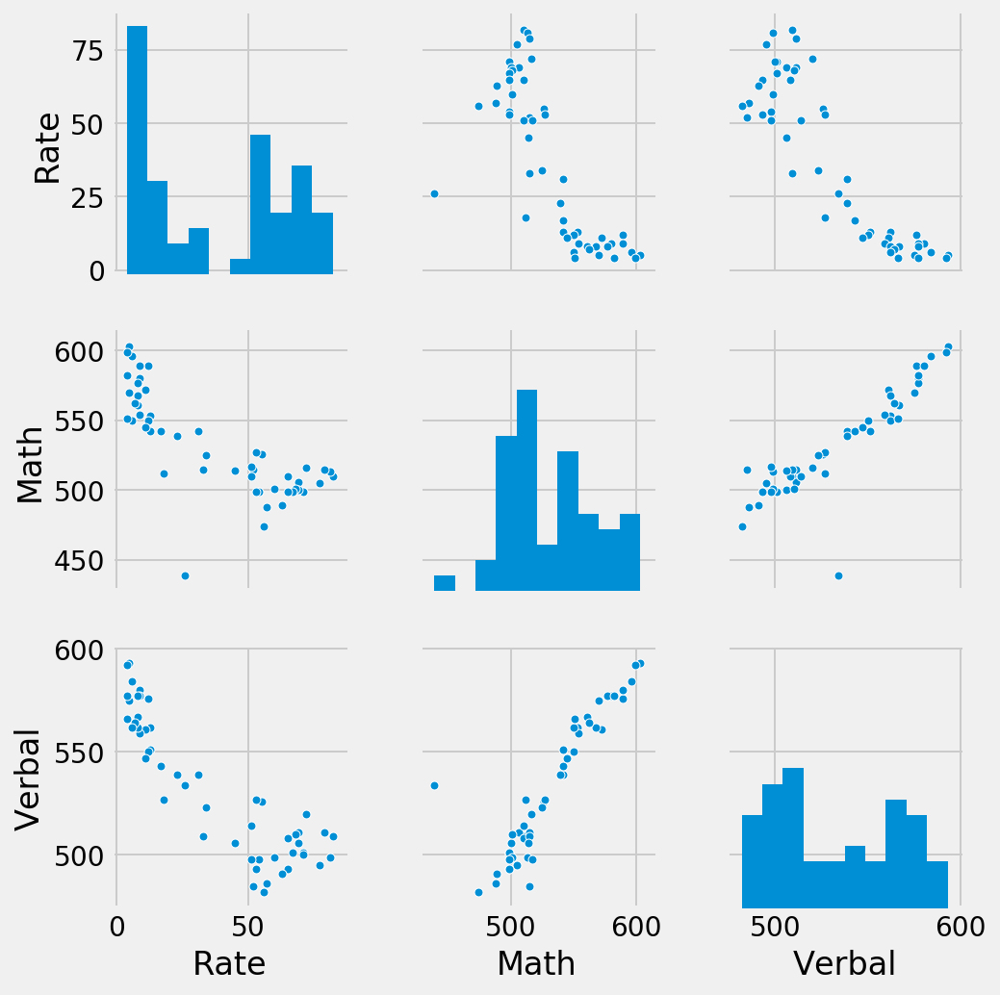

In [16]:
sns.pairplot(df_sat_scores_read[['Rate','Math','Verbal']], diag_kind="hist", plot_kws=dict(s=20))
#Math and Verbal scores are positively correlated
#Rate is negatively correlated with both Math and Verbal scores

<img src="http://imgur.com/l5NasQj.png" style="float: left; margin: 25px 15px 0px 0px; height: 25px">

## 4. Plot the data using built-in pandas functions.

---

Pandas is very powerful and contains a variety of nice, built-in plotting functions for your data. Read the documentation here to understand the capabilities:

http://pandas.pydata.org/pandas-docs/stable/visualization.html

### 4.1 Plot a stacked histogram with `Verbal` and `Math` using pandas

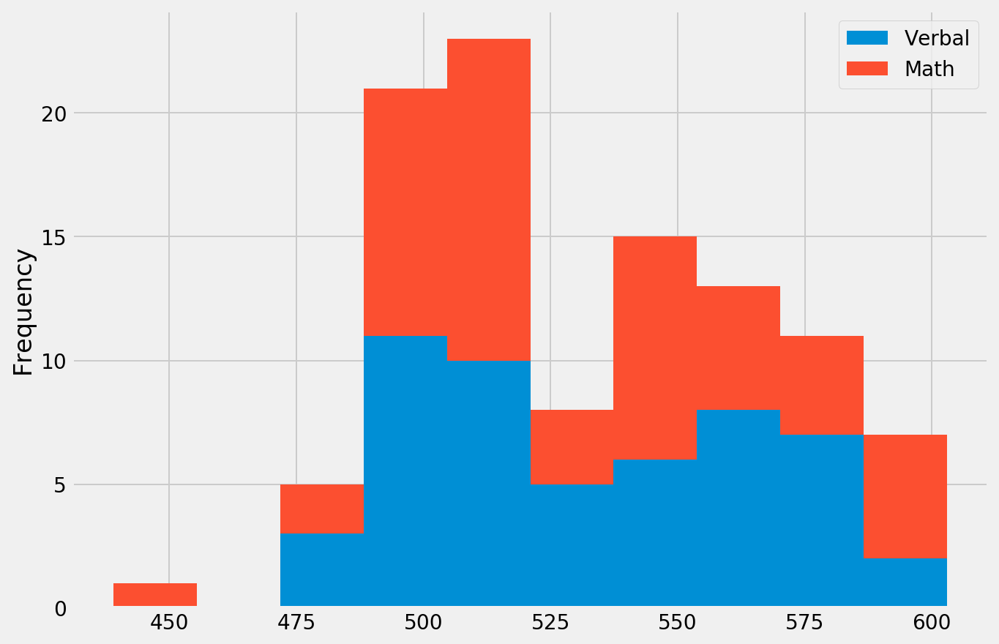

In [17]:
df_sat_scores_read[['Verbal', 'Math']].plot(kind='hist', stacked=True,figsize=(10,7))

### 4.2 Plot `Verbal` and `Math` on the same chart using boxplots

What are the benefits of using a boxplot as compared to a scatterplot or a histogram?

What's wrong with plotting a box-plot of `Rate` on the same chart as `Math` and `Verbal`?

[Text(0,0,u'Verbal'), Text(0,0,u'Math')]

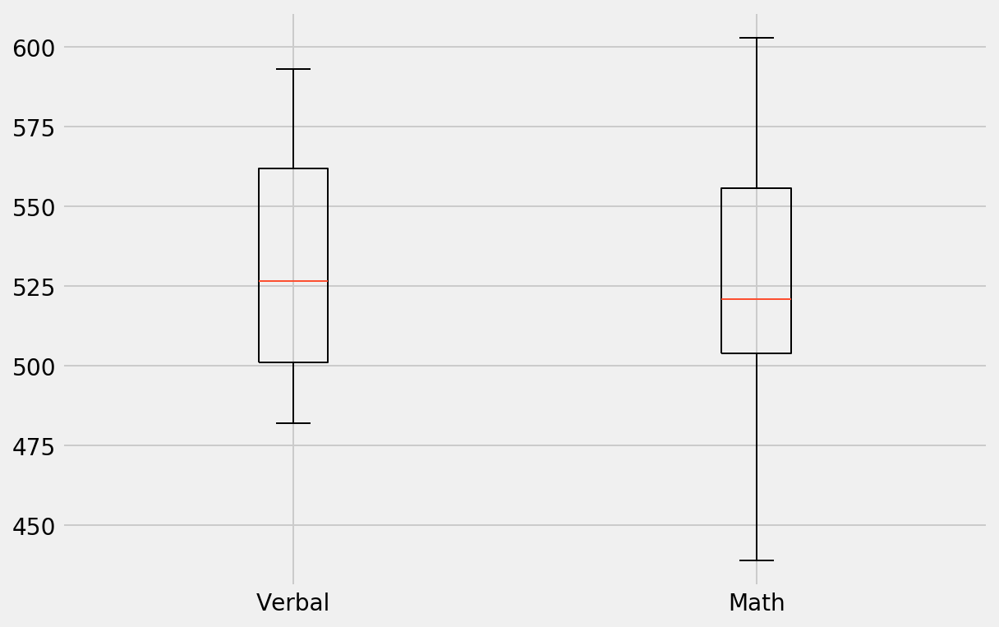

In [18]:
#create a list of data you want to plot
data_to_plot = [df_sat_scores_read.Verbal, df_sat_scores_read.Math]

#Create a figure instance
fig = plt.figure(figsize=(9,6))

#Create an axes instance
ax = fig.gca()

#Create the box plot
bg = ax.boxplot(data_to_plot)

#Create labels for box plot
ax.set_xticklabels(['Verbal','Math'])

# The boxplot shows 5 point summary and outliers and allow comparison of multi data sets
# The histogram could show a summary statistic for each data point in a set of categories However, it is difficult to compare two data sets
# The scatterplots are helpful for providing a sense of trends, concentrations, correlation patterns and outliers but interpretation can be subjective

#'Rate' is at lower range of 100 while 'Verbal' and 'Math' is at higher range of 500 thus the use of box-plox might not be appropriate for such comparison.

<img src="http://imgur.com/xDpSobf.png" style="float: left; margin: 25px 15px 0px 0px; height: 25px">

### 4.3 Plot `Verbal`, `Math`, and `Rate` appropriately on the same boxplot chart

Think about how you might change the variables so that they would make sense on the same chart. Explain your rationale for the choices on the chart. You should strive to make the chart as intuitive as possible. 


In [19]:
# In order tp standardize into same scale, z-scores are created for each variable
test_verbal = (df_sat_scores_read.Verbal-df_sat_scores_read.Verbal.mean())/df_sat_scores_read.Verbal.std()
test_math = (df_sat_scores_read.Math-df_sat_scores_read.Math.mean())/df_sat_scores_read.Math.std()
test_rate = (df_sat_scores_read.Rate-df_sat_scores_read.Rate.mean())/df_sat_scores_read.Rate.std()

[Text(0,0,u'Verbal'), Text(0,0,u'Math'), Text(0,0,u'Rate')]

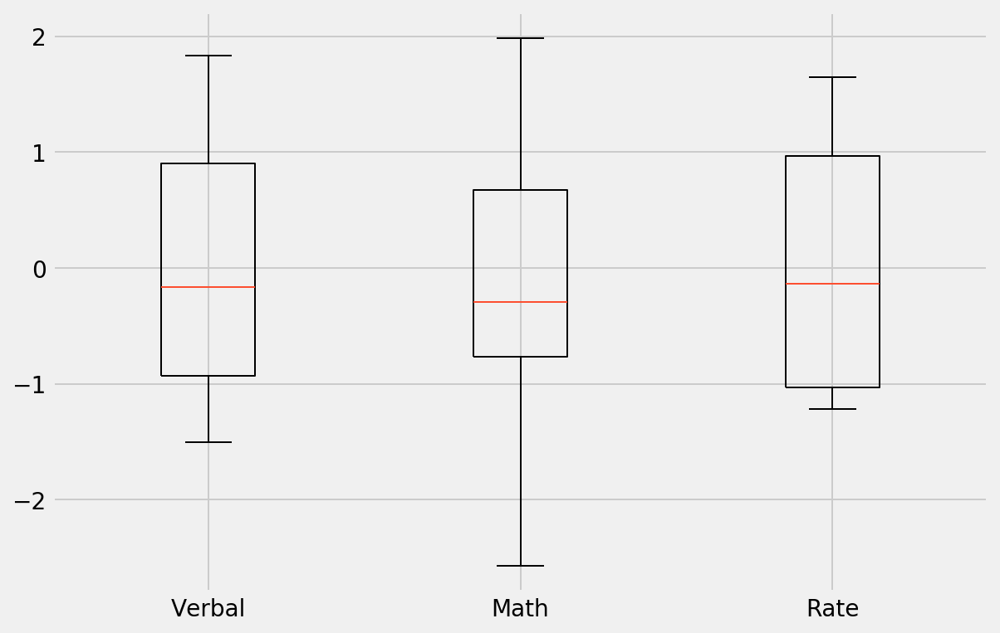

In [20]:
#create a list of data you want to plot
data_to_plot = [test_verbal, test_math, test_rate]

#Create a figure instance
fig = plt.figure(figsize=(9,6))

#Create an axes instance
ax = fig.gca()

#Create the box plot
bg = ax.boxplot(data_to_plot)

#Create labels for box plot
ax.set_xticklabels(['Verbal','Math','Rate'])

<img src="http://imgur.com/l5NasQj.png" style="float: left; margin: 25px 15px 0px 0px; height: 25px">

## 5. Create and examine subsets of the data

---

For these questions you will practice **masking** in pandas. Masking uses conditional statements to select portions of your DataFrame (through boolean operations under the hood.)

Remember the distinction between DataFrame indexing functions in pandas:

    .iloc[row, col] : row and column are specified by index, which are integers
    .loc[row, col]  : row and column are specified by string "labels" (boolean arrays are allowed; useful for rows)
    .ix[row, col]   : row and column indexers can be a mix of labels and integer indices
    
For detailed reference and tutorial make sure to read over the pandas documentation:

http://pandas.pydata.org/pandas-docs/stable/indexing.html



### 5.1 Find the list of states that have `Verbal` scores greater than the average of `Verbal` scores across states

How many states are above the mean? What does this tell you about the distribution of `Verbal` scores?




In [21]:
#list out all the states that its 'Verbal score above the mean.
verbal_above_mean =df_sat_scores_read[df_sat_scores_read['Verbal']>np.mean(df_sat_scores_read['Verbal'])]

#count the unique number of the status that its 'Verbal score above the mean.
print(verbal_above_mean['State'].value_counts()).head()
print(verbal_above_mean['State'].nunique())
#print the dataframe of verbal above mean
verbal_above_mean

KS    1
WY    1
MS    1
CO    1
NM    1
Name: State, dtype: int64
24


,State,Rate,Verbal,Math
26,CO,31,539,542
27,OH,26,534,439
28,MT,23,539,539
30,ID,17,543,542
31,TN,13,562,553
32,NM,13,551,542
33,IL,12,576,589
34,KY,12,550,550
35,WY,11,547,545
36,MI,11,561,572


### 5.2 Find the list of states that have `Verbal` scores greater than the median of `Verbal` scores across states

How does this compare to the list of states greater than the mean of `Verbal` scores? Why?

In [22]:
#list out all the states that its 'Verbal score above the median.
verbal_above_median =df_sat_scores_read[df_sat_scores_read['Verbal']>np.median(df_sat_scores_read['Verbal'])]

#count the unique number of the status that its 'Verbal score above the median.
print(verbal_above_median['State'].value_counts()).head()
print(verbal_above_median['State'].nunique())
#print the dataframe of verbal above median
verbal_above_median.head()

SD    1
KY    1
WA    1
AL    1
WI    1
Name: State, dtype: int64
26


,State,Rate,Verbal,Math
19,WA,53,527,527
26,CO,31,539,542
27,OH,26,534,439
28,MT,23,539,539
29,WV,18,527,512


### 5.3 Create a column that is the difference between the `Verbal` and `Math` scores

Specifically, this should be `Verbal - Math`.

In [23]:
df_sat_scores_read['Difference'] = df_sat_scores_read['Verbal']-df_sat_scores_read['Math']
df_sat_scores_read.head()

,State,Rate,Verbal,Math,Difference
0,CT,82,509,510,-1
1,NJ,81,499,513,-14
2,MA,79,511,515,-4
3,NY,77,495,505,-10
4,NH,72,520,516,4


### 5.4 Create two new DataFrames showing states with the greatest difference between scores

1. Your first DataFrame should be the 10 states with the greatest gap between `Verbal` and `Math` scores where `Verbal` is greater than `Math`. It should be sorted appropriately to show the ranking of states.
2. Your second DataFrame will be the inverse: states with the greatest gap between `Verbal` and `Math` such that `Math` is greater than `Verbal`. Again, this should be sorted appropriately to show rank.
3. Print the header of both variables, only showing the top 3 states in each.

In [24]:
verbal_greaterthan_math= df_sat_scores_read.sort_values(['Difference'], ascending=False).head(10)
verbal_greaterthan_math

,State,Rate,Verbal,Math,Difference
27,OH,26,534,439,95
50,MS,4,566,551,15
29,WV,18,527,512,15
45,AR,6,562,550,12
32,NM,13,551,542,9
31,TN,13,562,553,9
9,VA,68,510,501,9
16,DC,56,482,474,8
8,ME,69,506,500,6
41,OK,8,567,561,6


In [25]:
math_greaterthan_verbal= df_sat_scores_read.sort_values(['Difference'], ascending=True).head(10)
math_greaterthan_verbal

,State,Rate,Verbal,Math,Difference
21,HI,52,485,515,-30
23,CA,51,498,517,-19
1,NJ,81,499,513,-14
33,IL,12,576,589,-13
44,WI,6,584,596,-12
36,MI,11,561,572,-11
3,NY,77,495,505,-10
47,IA,5,593,603,-10
37,MN,9,580,589,-9
51,All,45,506,514,-8


In [26]:
print(verbal_greaterthan_math.head(3))
print(math_greaterthan_verbal.head(3))

   State  Rate  Verbal  Math  Difference
27    OH    26     534   439          95
50    MS     4     566   551          15
29    WV    18     527   512          15
   State  Rate  Verbal  Math  Difference
21    HI    52     485   515         -30
23    CA    51     498   517         -19
1     NJ    81     499   513         -14


## 6. Examine summary statistics

---

Checking the summary statistics for data is an essential step in the EDA process!

<img src="http://imgur.com/l5NasQj.png" style="float: left; margin: 25px 15px 0px 0px; height: 25px">

### 6.1 Create the correlation matrix of your variables (excluding `State`).

What does the correlation matrix tell you?


In [27]:
new_df_sat_scores=df_sat_scores_read[['Rate','Verbal','Math']] 
new_df_sat_scores.head()

,Rate,Verbal,Math
0,82,509,510
1,81,499,513
2,79,511,515
3,77,495,505
4,72,520,516


In [28]:
new_df_sat_scores.corr(method='pearson')

,Rate,Verbal,Math
Rate,1.000000,-0.886432,-0.773746
Verbal,-0.886432,1.000000,0.899871
Math,-0.773746,0.899871,1.000000


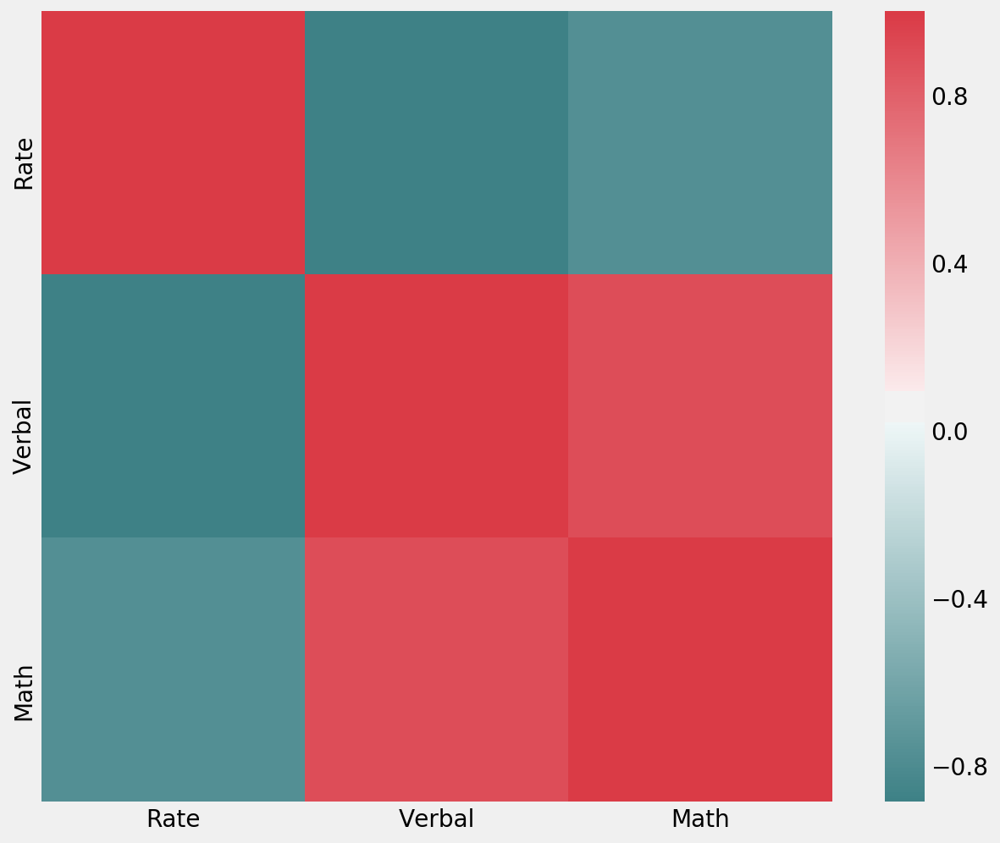

In [29]:
f, ax = plt.subplots(figsize=(10, 8))
corr = new_df_sat_scores.corr()
sns.heatmap(corr, mask=np.zeros_like(corr, dtype=np.bool), cmap=sns.diverging_palette(200, 10, as_cmap=True),
            square=True, ax=ax)

<img src="http://imgur.com/l5NasQj.png" style="float: left; margin: 25px 15px 0px 0px; height: 25px">

### 6.2 Use pandas'  `.describe()` built-in function on your DataFrame

Write up what each of the rows returned by the function indicate.

In [30]:
new_df_sat_scores.describe()
#count is the number of rows of data
#mean is the average value of the variable
#std is the standard deviation of the variable
#min is the minimum vale of the variable
#25% is the 25th percentile value of the variable distribution
#50% is the 25th percentile value of the variable distribution
#75% is the 25th percentile value of the variable distribution
#max is the maximum vale of the variable

,Rate,Verbal,Math
count,52.000000,52.000000,52.000000
mean,37.153846,532.019231,531.500000
std,27.301788,33.236225,36.014975
min,4.000000,482.000000,439.000000
25%,9.000000,501.000000,504.000000
50%,33.500000,526.500000,521.000000
75%,63.500000,562.000000,555.750000
max,82.000000,593.000000,603.000000


<img src="http://imgur.com/xDpSobf.png" style="float: left; margin: 25px 15px 0px 0px; height: 25px">

### 6.3 Assign and print the _covariance_ matrix for the dataset

1. Describe how the covariance matrix is different from the correlation matrix.
2. What is the process to convert the covariance into the correlation?
3. Why is the correlation matrix preferred to the covariance matrix for examining relationships in your data?

1. 
a. A measure used to indicate the extent to which two random variables change in tandem is known as covariance. A measure used to represent how strongly two random variables are related known as correlation.
b. Covariance is nothing but a measure of correlation. On the contrary, correlation refers to the scaled form of covariance.
c. The correlation of a random variable always takes place between 1 or -1 while the value of covariance are not limited.
d. Correlation is dimensionless, it is a unit-free measure of the relationship between variables while the value of covariance is obtained by the product of the units of the two variables.
e. The correlation matrix can be seen as the covariance matrix of the standardized random variables
f. Covariance is affected by the change in scale but correlation is not influenced by the change in scale. 

2. The correlation between two variables is the covariance between both variables divided by the product of the standard deviation of the variables X and Y. The formula showed as below
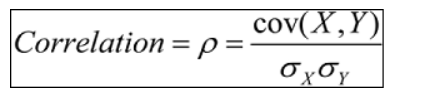

3. The correlation measure the strength of the linear relationship increases from 0 toward -1 or 1.

<img src="http://imgur.com/l5NasQj.png" style="float: left; margin: 25px 15px 0px 0px; height: 25px">

## 7. Performing EDA on "drug use by age" data.

---

You will now switch datasets to one with many more variables. This section of the project is more open-ended - use the techniques you practiced above!

We'll work with the "drug-use-by-age.csv" data, sourced from and described here: https://github.com/fivethirtyeight/data/tree/master/drug-use-by-age.

### 7.1

Load the data using pandas. Does this data require cleaning? Are variables missing? How will this affect your approach to EDA on the data?

In [31]:
drug_use_by_age_csv = './drug-use-by-age.csv'

drug=pd.read_csv(drug_use_by_age_csv)
drug.head()

,age,n,alcohol-use,alcohol-frequency,marijuana-use,marijuana-frequency,cocaine-use,cocaine-frequency,crack-use,crack-frequency,...,oxycontin-use,oxycontin-frequency,tranquilizer-use,tranquilizer-frequency,stimulant-use,stimulant-frequency,meth-use,meth-frequency,sedative-use,sedative-frequency
0,12,2798,3.9,3.0,1.1,4.0,0.1,5.0,0.0,-,...,0.1,24.5,0.2,52.0,0.2,2.0,0.0,-,0.2,13.0
1,13,2757,8.5,6.0,3.4,15.0,0.1,1.0,0.0,3.0,...,0.1,41.0,0.3,25.5,0.3,4.0,0.1,5.0,0.1,19.0
2,14,2792,18.1,5.0,8.7,24.0,0.1,5.5,0.0,-,...,0.4,4.5,0.9,5.0,0.8,12.0,0.1,24.0,0.2,16.5
3,15,2956,29.2,6.0,14.5,25.0,0.5,4.0,0.1,9.5,...,0.8,3.0,2.0,4.5,1.5,6.0,0.3,10.5,0.4,30.0
4,16,3058,40.1,10.0,22.5,30.0,1.0,7.0,0.0,1.0,...,1.1,4.0,2.4,11.0,1.8,9.5,0.3,36.0,0.2,3.0


In [32]:
#Split the range of age to started_age and ended_age and assigned to a new dataframe called "drug2"
import string

drug2=drug['age'].str.split('-',1, expand=True)
names = ['started_age','ended_age']
drug2.columns= names
drug2

,started_age,ended_age
0,12,None
1,13,None
2,14,None
3,15,None
4,16,None
5,17,None
6,18,None
7,19,None
8,20,None
9,21,None


In [33]:
#convert all non-int objects to integer for column 'started_age'
drug2[drug2['started_age']=='65+']=65
drug2['started_age'] = drug2['started_age'].map(lambda x : int (x))


In [34]:
#Assigned None in column 'ended_age' to the column 'ended_age'
drug2.iloc[0:10, 1] = drug2.iloc[0:10, 0]
drug2['ended_age'] = drug2['ended_age'].map(lambda x : int (x))

In [35]:
#concatenate 2 dataframes and drop one unwanted column
new_drug=pd.concat([drug2, drug], axis=1)
new_drug.drop(['age'],axis=1,inplace=True)
new_drug.head()

,started_age,ended_age,n,alcohol-use,alcohol-frequency,marijuana-use,marijuana-frequency,cocaine-use,cocaine-frequency,crack-use,...,oxycontin-use,oxycontin-frequency,tranquilizer-use,tranquilizer-frequency,stimulant-use,stimulant-frequency,meth-use,meth-frequency,sedative-use,sedative-frequency
0,12,12,2798,3.9,3.0,1.1,4.0,0.1,5.0,0.0,...,0.1,24.5,0.2,52.0,0.2,2.0,0.0,-,0.2,13.0
1,13,13,2757,8.5,6.0,3.4,15.0,0.1,1.0,0.0,...,0.1,41.0,0.3,25.5,0.3,4.0,0.1,5.0,0.1,19.0
2,14,14,2792,18.1,5.0,8.7,24.0,0.1,5.5,0.0,...,0.4,4.5,0.9,5.0,0.8,12.0,0.1,24.0,0.2,16.5
3,15,15,2956,29.2,6.0,14.5,25.0,0.5,4.0,0.1,...,0.8,3.0,2.0,4.5,1.5,6.0,0.3,10.5,0.4,30.0
4,16,16,3058,40.1,10.0,22.5,30.0,1.0,7.0,0.0,...,1.1,4.0,2.4,11.0,1.8,9.5,0.3,36.0,0.2,3.0


In [36]:
#check the data type of all column again after adding new columns and drop unwanted columns
new_drug.info()
# missing values with '-' are making columns into objects, hence, required cleaning

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 17 entries, 0 to 16
Data columns (total 29 columns):
started_age                17 non-null int64
ended_age                  17 non-null int64
n                          17 non-null int64
alcohol-use                17 non-null float64
alcohol-frequency          17 non-null float64
marijuana-use              17 non-null float64
marijuana-frequency        17 non-null float64
cocaine-use                17 non-null float64
cocaine-frequency          17 non-null object
crack-use                  17 non-null float64
crack-frequency            17 non-null object
heroin-use                 17 non-null float64
heroin-frequency           17 non-null object
hallucinogen-use           17 non-null float64
hallucinogen-frequency     17 non-null float64
inhalant-use               17 non-null float64
inhalant-frequency         17 non-null object
pain-releiver-use          17 non-null float64
pain-releiver-frequency    17 non-null float64
oxycontin-use 

In [37]:
#use try and except to check the non-numeric objects then covert objects to null
new_drug.loc[new_drug[new_drug['cocaine-frequency']=='-'].index, 'cocaine-frequency'] = 0.0
new_drug.loc[new_drug[new_drug['oxycontin-frequency']=='-'].index, 'oxycontin-frequency'] = 0.0
new_drug.loc[new_drug[new_drug['meth-frequency']=='-'].index, 'meth-frequency'] = 0.0
new_drug.loc[new_drug[new_drug['inhalant-frequency']=='-'].index, 'inhalant-frequency'] = 0.0
new_drug.loc[new_drug[new_drug['crack-frequency']=='-'].index, 'crack-frequency'] = 0.0
new_drug.loc[new_drug[new_drug['heroin-frequency']=='-'].index, 'heroin-frequency'] = 0.0

In [38]:
#covert all object types data to float type
new_drug['cocaine-frequency'] = new_drug['cocaine-frequency'].map(lambda x : float (x))
new_drug['oxycontin-frequency'] = new_drug['oxycontin-frequency'].map(lambda x : float (x))
new_drug['meth-frequency'] = new_drug['meth-frequency'].map(lambda x : float (x))
new_drug['crack-frequency'] = new_drug['crack-frequency'].map(lambda x : float (x))
new_drug['inhalant-frequency'] = new_drug['inhalant-frequency'].map(lambda x : float (x))
new_drug['heroin-frequency'] = new_drug['heroin-frequency'].map(lambda x : float (x))

In [39]:
#check the type of all columns after converted object to float
new_drug.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 17 entries, 0 to 16
Data columns (total 29 columns):
started_age                17 non-null int64
ended_age                  17 non-null int64
n                          17 non-null int64
alcohol-use                17 non-null float64
alcohol-frequency          17 non-null float64
marijuana-use              17 non-null float64
marijuana-frequency        17 non-null float64
cocaine-use                17 non-null float64
cocaine-frequency          17 non-null float64
crack-use                  17 non-null float64
crack-frequency            17 non-null float64
heroin-use                 17 non-null float64
heroin-frequency           17 non-null float64
hallucinogen-use           17 non-null float64
hallucinogen-frequency     17 non-null float64
inhalant-use               17 non-null float64
inhalant-frequency         17 non-null float64
pain-releiver-use          17 non-null float64
pain-releiver-frequency    17 non-null float64
oxycontin-

In [40]:
#print out the dataframe to have a look
new_drug

,started_age,ended_age,n,alcohol-use,alcohol-frequency,marijuana-use,marijuana-frequency,cocaine-use,cocaine-frequency,crack-use,...,oxycontin-use,oxycontin-frequency,tranquilizer-use,tranquilizer-frequency,stimulant-use,stimulant-frequency,meth-use,meth-frequency,sedative-use,sedative-frequency
0,12,12,2798,3.9,3.0,1.1,4.0,0.1,5.0,0.0,...,0.1,24.5,0.2,52.0,0.2,2.0,0.0,0.0,0.2,13.0
1,13,13,2757,8.5,6.0,3.4,15.0,0.1,1.0,0.0,...,0.1,41.0,0.3,25.5,0.3,4.0,0.1,5.0,0.1,19.0
2,14,14,2792,18.1,5.0,8.7,24.0,0.1,5.5,0.0,...,0.4,4.5,0.9,5.0,0.8,12.0,0.1,24.0,0.2,16.5
3,15,15,2956,29.2,6.0,14.5,25.0,0.5,4.0,0.1,...,0.8,3.0,2.0,4.5,1.5,6.0,0.3,10.5,0.4,30.0
4,16,16,3058,40.1,10.0,22.5,30.0,1.0,7.0,0.0,...,1.1,4.0,2.4,11.0,1.8,9.5,0.3,36.0,0.2,3.0
5,17,17,3038,49.3,13.0,28.0,36.0,2.0,5.0,0.1,...,1.4,6.0,3.5,7.0,2.8,9.0,0.6,48.0,0.5,6.5
6,18,18,2469,58.7,24.0,33.7,52.0,3.2,5.0,0.4,...,1.7,7.0,4.9,12.0,3.0,8.0,0.5,12.0,0.4,10.0
7,19,19,2223,64.6,36.0,33.4,60.0,4.1,5.5,0.5,...,1.5,7.5,4.2,4.5,3.3,6.0,0.4,105.0,0.3,6.0
8,20,20,2271,69.7,48.0,34.0,60.0,4.9,8.0,0.6,...,1.7,12.0,5.4,10.0,4.0,12.0,0.9,12.0,0.5,4.0
9,21,21,2354,83.2,52.0,33.0,52.0,4.8,5.0,0.5,...,1.3,13.5,3.9,7.0,4.1,10.0,0.6,2.0,0.3,9.0


### 7.2 Do a high-level, initial overview of the data

Get a feel for what this dataset is all about.

Use whichever techniques you'd like, including those from the SAT dataset EDA. The final response to this question should be a written description of what you infer about the dataset.

Some things to consider doing:

    Look for relationships between variables and subsets of those variables' values
    Derive new features from the ones available to help your analysis
    Visualize everything!

In [41]:
#Compute correlation of all columns
new_drug.corr(method='pearson')

,started_age,ended_age,n,alcohol-use,alcohol-frequency,marijuana-use,marijuana-frequency,cocaine-use,cocaine-frequency,crack-use,...,oxycontin-use,oxycontin-frequency,tranquilizer-use,tranquilizer-frequency,stimulant-use,stimulant-frequency,meth-use,meth-frequency,sedative-use,sedative-frequency
started_age,1.000000,0.972066,0.209636,0.347178,0.629531,-0.365037,0.296227,-0.179095,0.402070,0.106592,...,-0.371449,-0.225513,-0.250137,-0.316679,-0.382329,0.778792,-0.261252,0.036702,-0.394353,0.396722
ended_age,0.972066,1.000000,0.365221,0.380193,0.644513,-0.388171,0.320939,-0.190908,0.565171,0.181815,...,-0.398513,-0.192473,-0.254760,-0.304613,-0.422972,0.632131,-0.271954,0.154222,-0.335264,0.479843
n,0.209636,0.365221,1.000000,0.310512,0.313431,-0.169007,0.135597,-0.021565,0.388318,0.281797,...,-0.166039,0.021226,-0.071086,-0.102301,-0.201621,-0.114792,-0.063571,0.510735,-0.119997,0.256701
alcohol-use,0.347178,0.380193,0.310512,1.000000,0.897889,0.594165,0.920425,0.773458,0.260301,0.877378,...,0.589219,-0.033615,0.735785,-0.550501,0.582241,-0.028115,0.682531,0.376863,0.318268,0.091251
alcohol-frequency,0.629531,0.644513,0.313431,0.897889,1.000000,0.260219,0.818769,0.577601,0.317172,0.785050,...,0.251554,0.049388,0.448543,-0.415026,0.291766,0.260304,0.425153,0.252246,0.029867,0.201423
marijuana-use,-0.365037,-0.388171,-0.169007,0.594165,0.260219,1.000000,0.615610,0.883789,-0.154879,0.620670,...,0.971733,-0.180840,0.935199,-0.401769,0.968096,-0.389145,0.870446,0.218681,0.616766,-0.277144
marijuana-frequency,0.296227,0.320939,0.135597,0.920425,0.818769,0.615610,1.000000,0.742598,0.265193,0.892077,...,0.609618,0.066200,0.768339,-0.591449,0.561246,-0.069454,0.664280,0.417947,0.399124,0.048777
cocaine-use,-0.179095,-0.190908,-0.021565,0.773458,0.577601,0.883789,0.742598,1.000000,-0.077848,0.835727,...,0.865626,0.017269,0.920430,-0.294905,0.923954,-0.309286,0.889353,0.199366,0.461914,-0.159997
cocaine-frequency,0.402070,0.565171,0.388318,0.260301,0.317172,-0.154879,0.265193,-0.077848,1.000000,0.307329,...,-0.152548,-0.154491,-0.080911,-0.103142,-0.230324,-0.183692,-0.080921,0.240660,0.021109,0.761572
crack-use,0.106592,0.181815,0.281797,0.877378,0.785050,0.620670,0.892077,0.835727,0.307329,1.000000,...,0.603003,0.140619,0.772651,-0.345668,0.618008,-0.294260,0.694324,0.404741,0.438421,0.091676


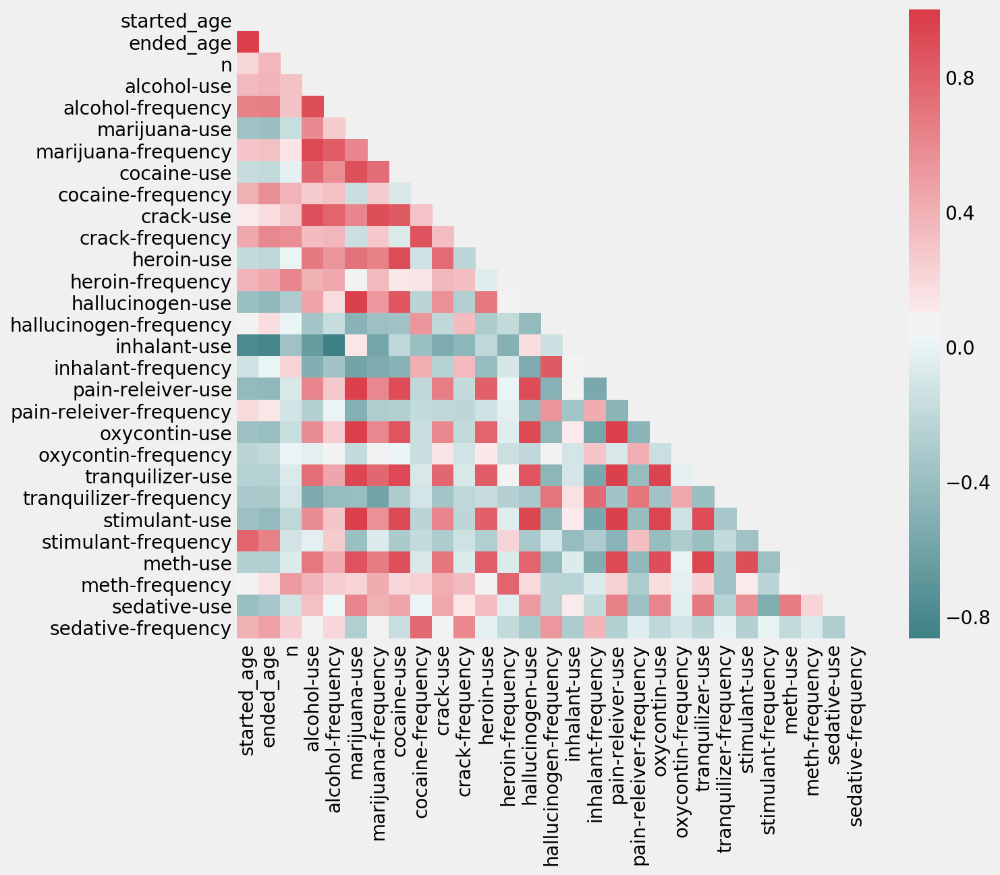

In [42]:
# Initialize a `matplotlib` figure
f, ax = plt.subplots(figsize=(10, 8))
corr = new_drug.corr()

#Generate mask for upper triangle
mask=np.zeros_like(corr, dtype=np.bool)
mask[np.triu_indices_from(mask)] = True

#Visualize the correlation of all columns using heatmap
sns.heatmap(corr, mask=mask, cmap=sns.diverging_palette(200, 10, as_cmap=True),
            square=True, xticklabels=corr.columns, yticklabels=corr.columns)



### 7.3 Create a testable hypothesis about this data

Requirements for the question:

1. Write a specific question you would like to answer with the data (that can be accomplished with EDA).
2. Write a description of the "deliverables": what will you report after testing/examining your hypothesis?
3. Use EDA techniques of your choice, numeric and/or visual, to look into your question.
4. Write up your report on what you have found regarding the hypothesis about the data you came up with.


Your hypothesis could be on:

- Difference of group means
- Correlations between variables
- Anything else you think is interesting, testable, and meaningful!

**Important notes:**

You should be only doing EDA _relevant to your question_ here. It is easy to go down rabbit holes trying to look at every facet of your data, and so we want you to get in the practice of specifying a hypothesis you are interested in first and scoping your work to specifically answer that question.

Some of you may want to jump ahead to "modeling" data to answer your question. This is a topic addressed in the next project and **you should not do this for this project.** We specifically want you to not do modeling to emphasize the importance of performing EDA _before_ you jump to statistical analysis.

### Analyze number of drugs users

             started_age         n
started_age     1.000000  0.209636
n               0.209636  1.000000


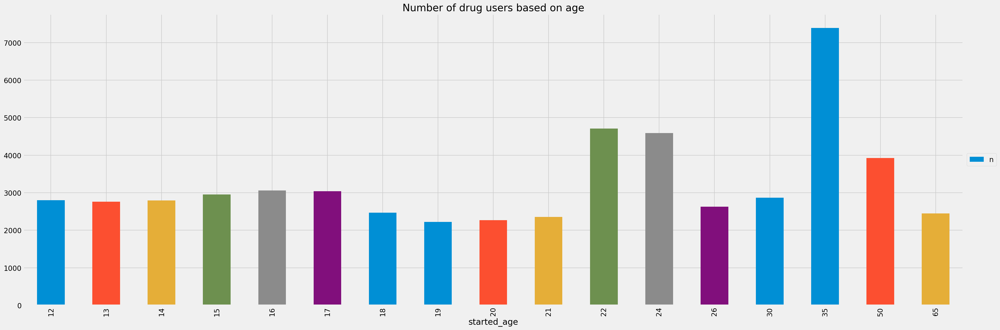

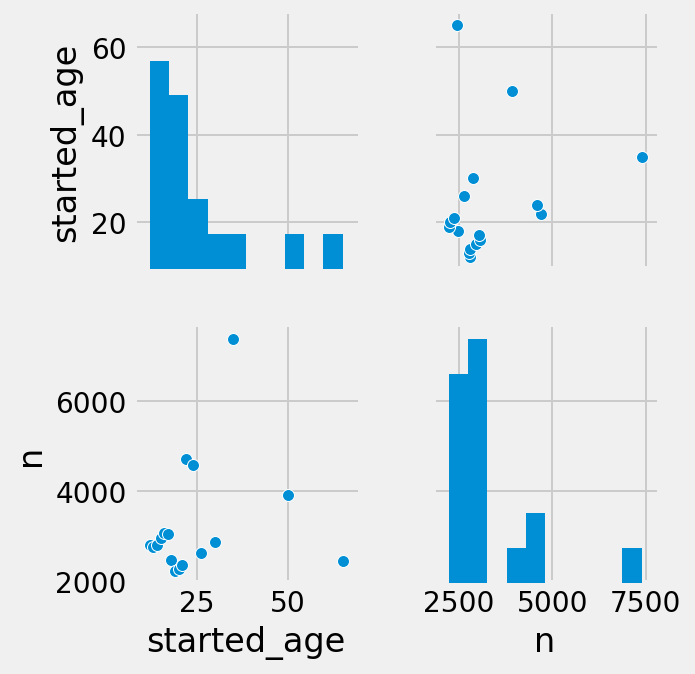

In [43]:
#Analyze the number of drugs users
new_drug_n = new_drug[['started_age','n']]

new_drug_n.plot(x="started_age", y="n", kind='bar', title='Number of drug users based on age', legend=True, figsize=(30,10))

plt.legend(loc='center left', bbox_to_anchor=(1.0, 0.5))

sns.pairplot(new_drug_n)

print new_drug_n.corr(method='pearson')

### Conclusion:

From what we could see from the bar chart, most of the drug users are from the age group of 35-49. However, there is a range of 15 within this group. If the total number of 7391 drugs divided by 15, there is the only average of 492 per age of users. However, the age of 16 with number of 3058 of drug users. Hence, based on the analysis, we could reasonably concluded that most drug users are from age of 16 followed by age of 17.

### Analyze correlations between the use and frequency of all drug

In [44]:
#Create a new dataFrame and excluded unwanted columns 'ended_age' and 'number of people'
#Reason for removing the unwanted columns
#ended_age- for my analysis, I use the 'started_age' as the baseline, 'ended_age' might not be useful anymore and would confuse others
#n- n is analyze seperately using bar chart
new_drug2 = new_drug
new_drug2.drop(columns=['ended_age','n'],axis=1)
new_drug2.head()

,started_age,ended_age,n,alcohol-use,alcohol-frequency,marijuana-use,marijuana-frequency,cocaine-use,cocaine-frequency,crack-use,...,oxycontin-use,oxycontin-frequency,tranquilizer-use,tranquilizer-frequency,stimulant-use,stimulant-frequency,meth-use,meth-frequency,sedative-use,sedative-frequency
0,12,12,2798,3.9,3.0,1.1,4.0,0.1,5.0,0.0,...,0.1,24.5,0.2,52.0,0.2,2.0,0.0,0.0,0.2,13.0
1,13,13,2757,8.5,6.0,3.4,15.0,0.1,1.0,0.0,...,0.1,41.0,0.3,25.5,0.3,4.0,0.1,5.0,0.1,19.0
2,14,14,2792,18.1,5.0,8.7,24.0,0.1,5.5,0.0,...,0.4,4.5,0.9,5.0,0.8,12.0,0.1,24.0,0.2,16.5
3,15,15,2956,29.2,6.0,14.5,25.0,0.5,4.0,0.1,...,0.8,3.0,2.0,4.5,1.5,6.0,0.3,10.5,0.4,30.0
4,16,16,3058,40.1,10.0,22.5,30.0,1.0,7.0,0.0,...,1.1,4.0,2.4,11.0,1.8,9.5,0.3,36.0,0.2,3.0


In [45]:
#print the new dataframe and check whether the unwanted columns have been excluded.
new_drug2

,started_age,ended_age,n,alcohol-use,alcohol-frequency,marijuana-use,marijuana-frequency,cocaine-use,cocaine-frequency,crack-use,...,oxycontin-use,oxycontin-frequency,tranquilizer-use,tranquilizer-frequency,stimulant-use,stimulant-frequency,meth-use,meth-frequency,sedative-use,sedative-frequency
0,12,12,2798,3.9,3.0,1.1,4.0,0.1,5.0,0.0,...,0.1,24.5,0.2,52.0,0.2,2.0,0.0,0.0,0.2,13.0
1,13,13,2757,8.5,6.0,3.4,15.0,0.1,1.0,0.0,...,0.1,41.0,0.3,25.5,0.3,4.0,0.1,5.0,0.1,19.0
2,14,14,2792,18.1,5.0,8.7,24.0,0.1,5.5,0.0,...,0.4,4.5,0.9,5.0,0.8,12.0,0.1,24.0,0.2,16.5
3,15,15,2956,29.2,6.0,14.5,25.0,0.5,4.0,0.1,...,0.8,3.0,2.0,4.5,1.5,6.0,0.3,10.5,0.4,30.0
4,16,16,3058,40.1,10.0,22.5,30.0,1.0,7.0,0.0,...,1.1,4.0,2.4,11.0,1.8,9.5,0.3,36.0,0.2,3.0
5,17,17,3038,49.3,13.0,28.0,36.0,2.0,5.0,0.1,...,1.4,6.0,3.5,7.0,2.8,9.0,0.6,48.0,0.5,6.5
6,18,18,2469,58.7,24.0,33.7,52.0,3.2,5.0,0.4,...,1.7,7.0,4.9,12.0,3.0,8.0,0.5,12.0,0.4,10.0
7,19,19,2223,64.6,36.0,33.4,60.0,4.1,5.5,0.5,...,1.5,7.5,4.2,4.5,3.3,6.0,0.4,105.0,0.3,6.0
8,20,20,2271,69.7,48.0,34.0,60.0,4.9,8.0,0.6,...,1.7,12.0,5.4,10.0,4.0,12.0,0.9,12.0,0.5,4.0
9,21,21,2354,83.2,52.0,33.0,52.0,4.8,5.0,0.5,...,1.3,13.5,3.9,7.0,4.1,10.0,0.6,2.0,0.3,9.0


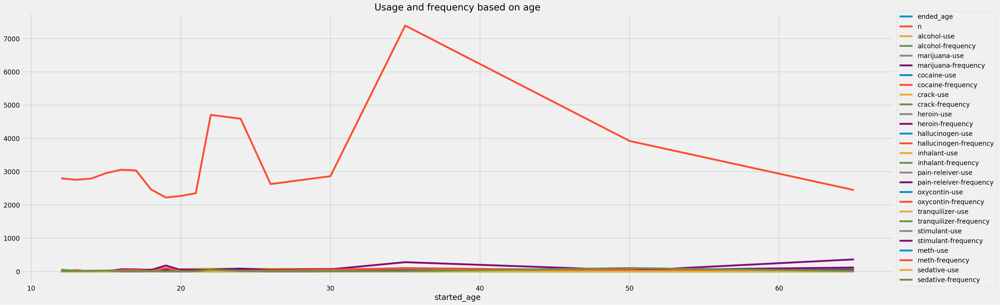

In [46]:
#create a line chart to plot all use and frequency of drugs based on the started age
new_drug2.plot(x="started_age", kind='line', title='Usage and frequency based on age', legend=True, figsize=(30,10))

plt.legend(loc='center left', bbox_to_anchor=(1.0, 0.5))

                   started_age  alcohol-use  alcohol-frequency
started_age           1.000000     0.347178           0.629531
alcohol-use           0.347178     1.000000           0.897889
alcohol-frequency     0.629531     0.897889           1.000000


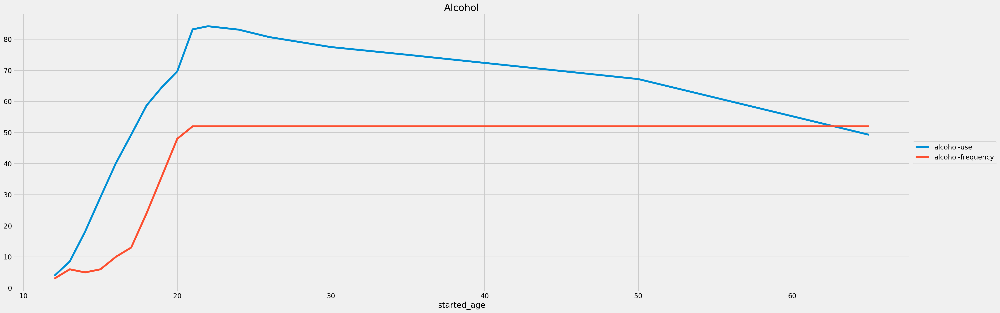

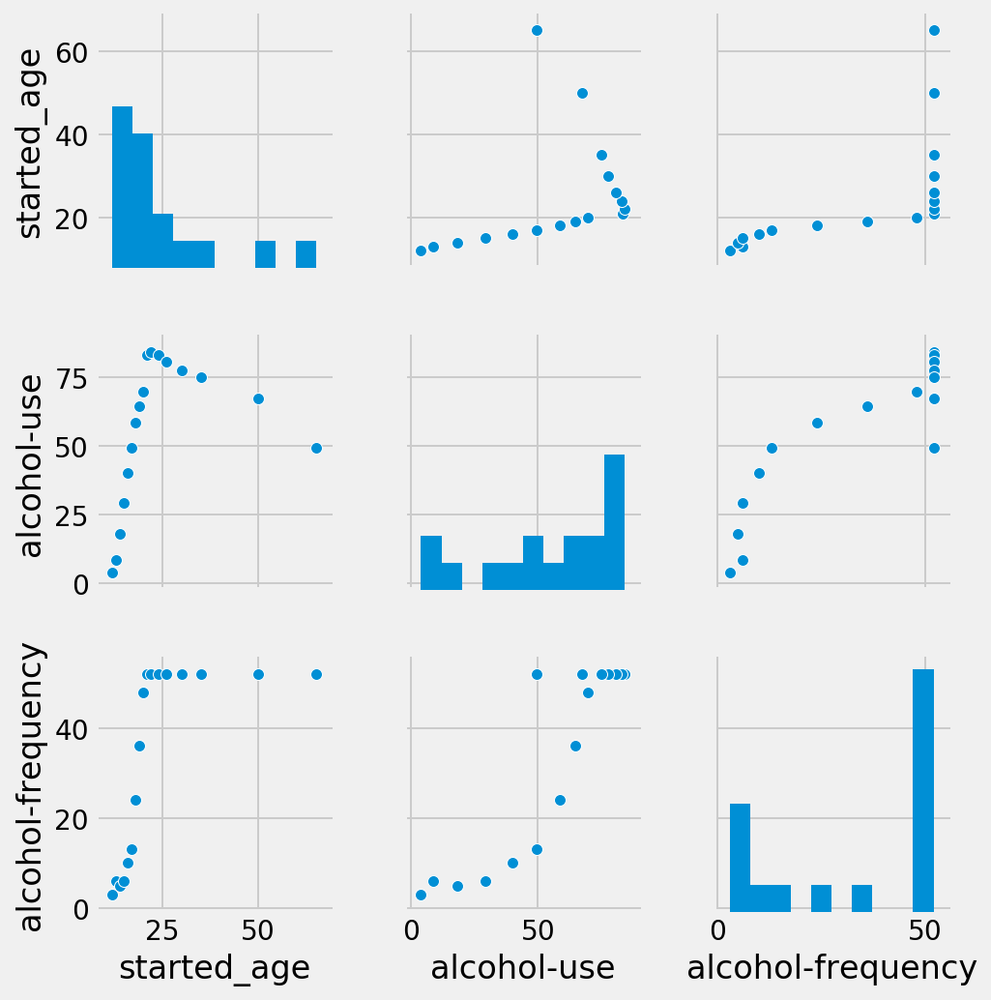

In [47]:
# Analyze the correlationship between strated_age, alcohol-use and alcohol-frequency
new_drug_alcohol = new_drug2[['started_age','alcohol-use','alcohol-frequency']]

new_drug_alcohol.plot(x="started_age", kind='line', title='Alcohol', legend=True, figsize=(30,10))

plt.legend(loc='center left', bbox_to_anchor=(1.0, 0.5))

sns.pairplot(new_drug_alcohol)

print new_drug_alcohol.corr(method='pearson')

# from the analysis, we could see that there is high positive correlationship between alcohol-use and alcohol-frequency.

                     started_age  marijuana-use  marijuana-frequency
started_age             1.000000      -0.365037             0.296227
marijuana-use          -0.365037       1.000000             0.615610
marijuana-frequency     0.296227       0.615610             1.000000


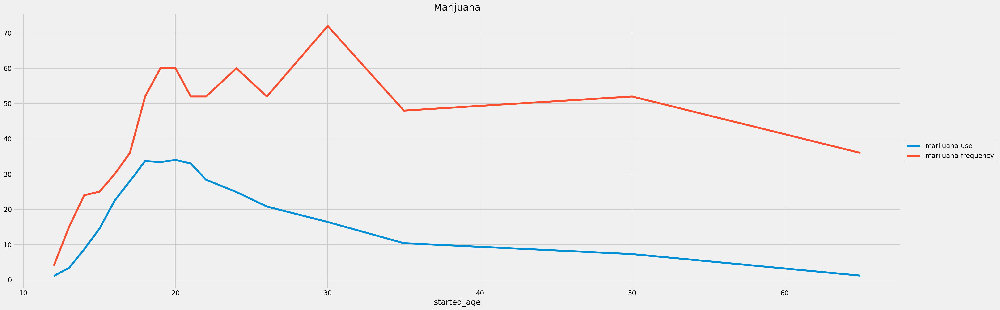

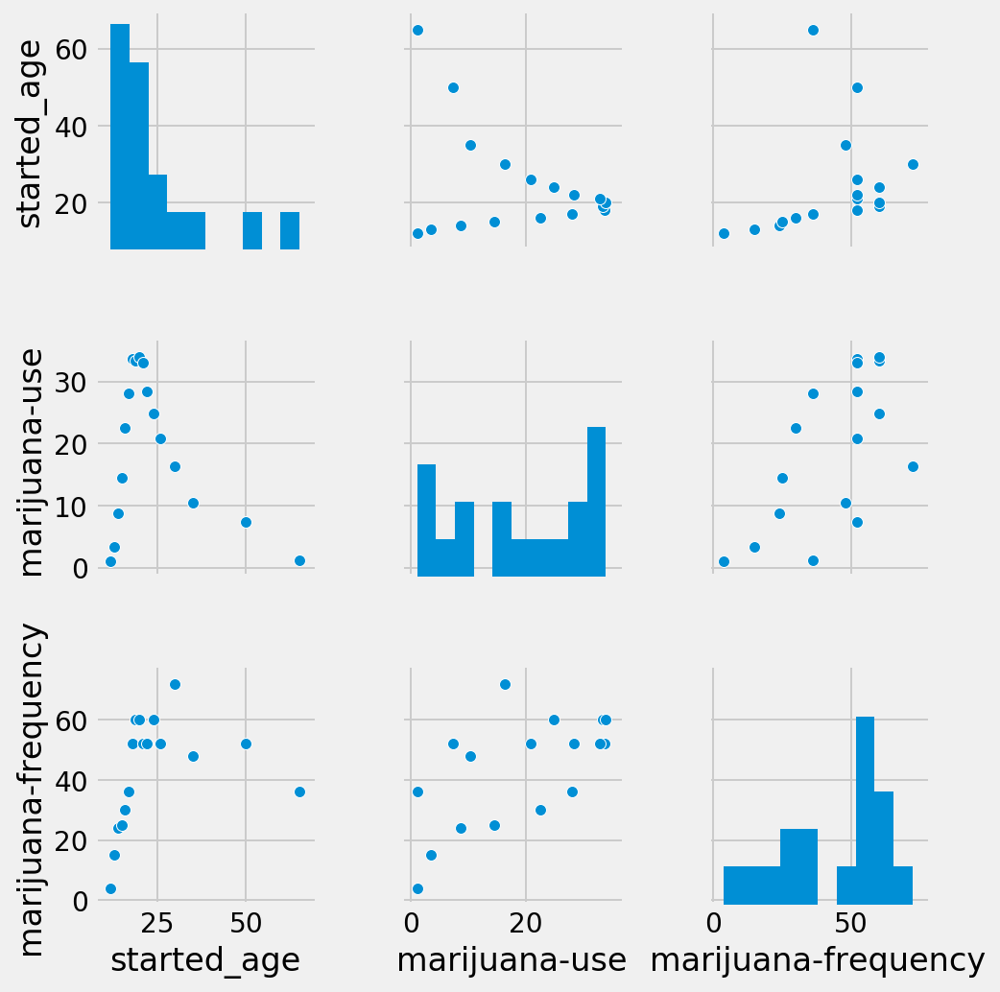

In [48]:
# Analyze the correlationship between strated_age, marijuana-use and marijuana-frequency

new_drug_marijuana = new_drug2[['started_age','marijuana-use','marijuana-frequency']]

new_drug_marijuana.plot(x="started_age", kind='line', title='Marijuana', legend=True, figsize=(30,10))

plt.legend(loc='center left', bbox_to_anchor=(1.0, 0.5))

sns.pairplot(new_drug_marijuana)

print new_drug_marijuana.corr(method='pearson')

                   started_age  cocaine-use  cocaine-frequency
started_age           1.000000    -0.179095           0.402070
cocaine-use          -0.179095     1.000000          -0.077848
cocaine-frequency     0.402070    -0.077848           1.000000


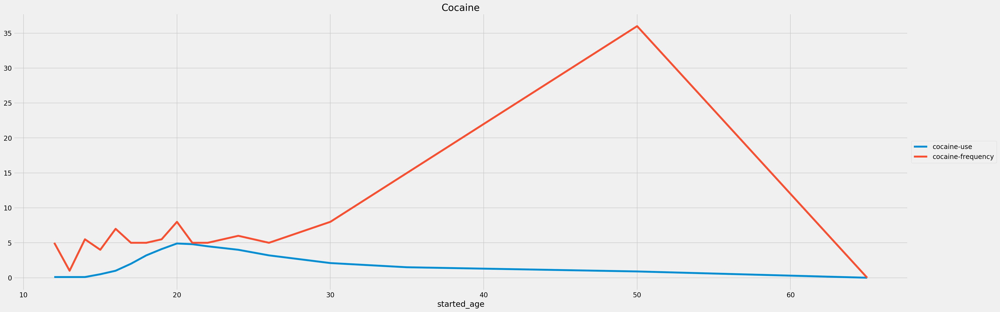

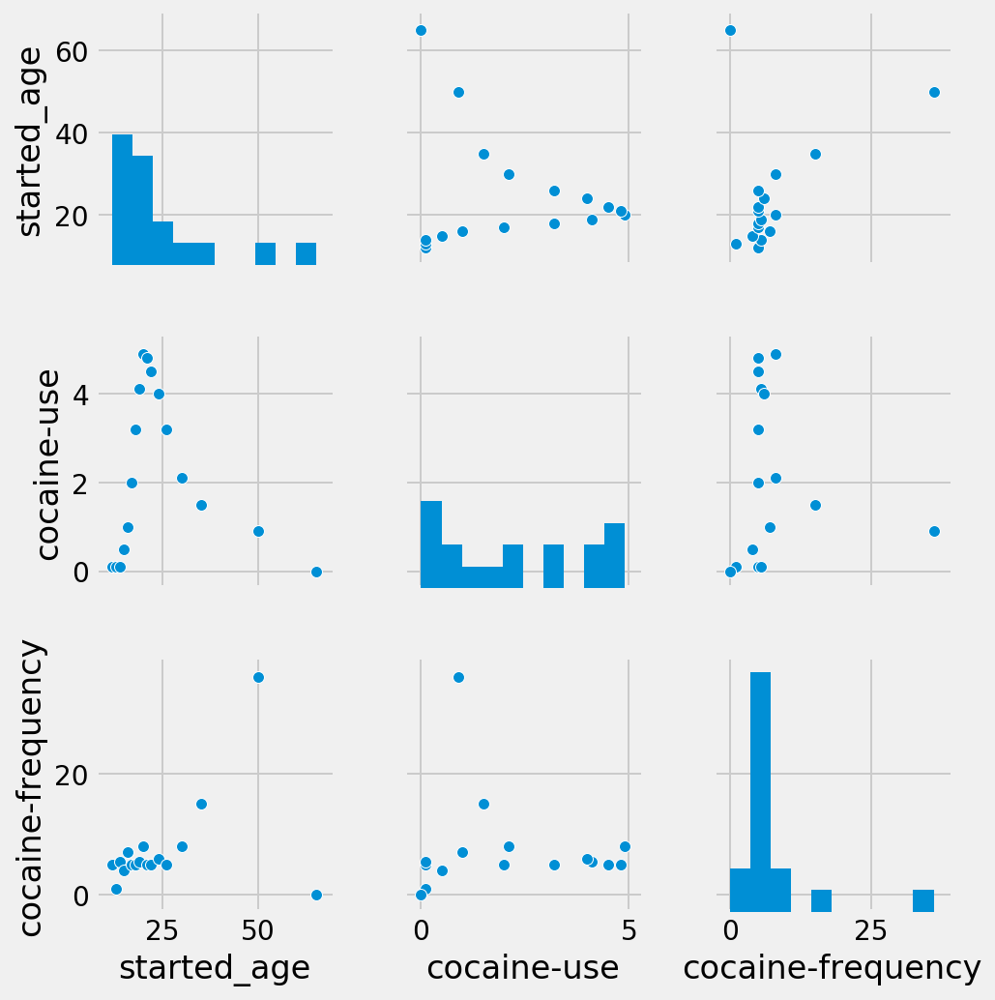

In [49]:
# Analyze the correlationship between strated_age, marijuana-use and marijuana-frequency

new_drug_cocaine = new_drug2[['started_age','cocaine-use','cocaine-frequency']]

new_drug_cocaine.plot(x="started_age", kind='line', title='Cocaine', legend=True, figsize=(30,10))

plt.legend(loc='center left', bbox_to_anchor=(1.0, 0.5))

sns.pairplot(new_drug_cocaine)

print new_drug_cocaine.corr(method='pearson')

                 started_age  crack-use  crack-frequency
started_age         1.000000   0.106592         0.436867
crack-use           0.106592   1.000000         0.333440
crack-frequency     0.436867   0.333440         1.000000


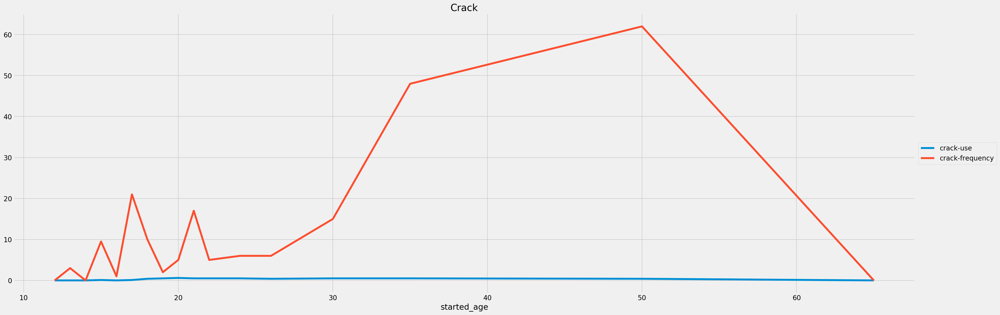

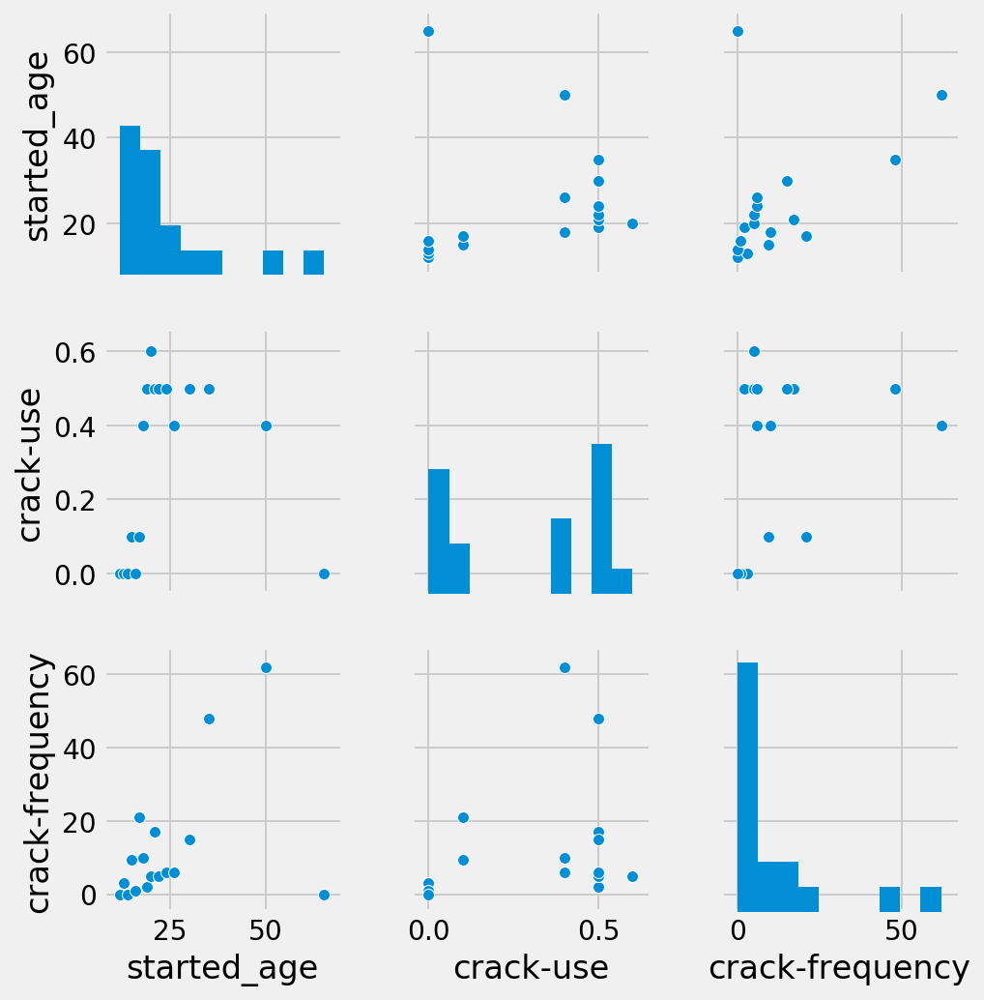

In [50]:
# Analyze the correlationship between strated_age, crack-use and crack-frequency

new_drug_crack = new_drug2[['started_age','crack-use','crack-frequency']]

new_drug_crack.plot(x="started_age", kind='line', title='Crack', legend=True, figsize=(30,10))

plt.legend(loc='center left', bbox_to_anchor=(1.0, 0.5))

sns.pairplot(new_drug_crack)

print new_drug_crack.corr(method='pearson')

                  started_age  heroin-use  heroin-frequency
started_age          1.000000   -0.184835          0.376761
heroin-use          -0.184835    1.000000         -0.044239
heroin-frequency     0.376761   -0.044239          1.000000


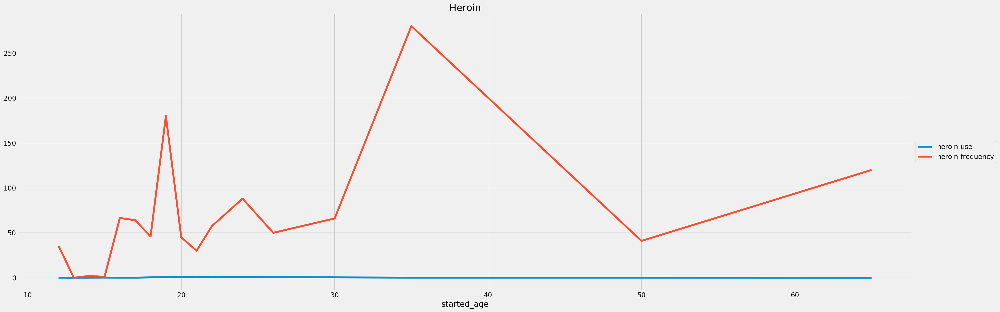

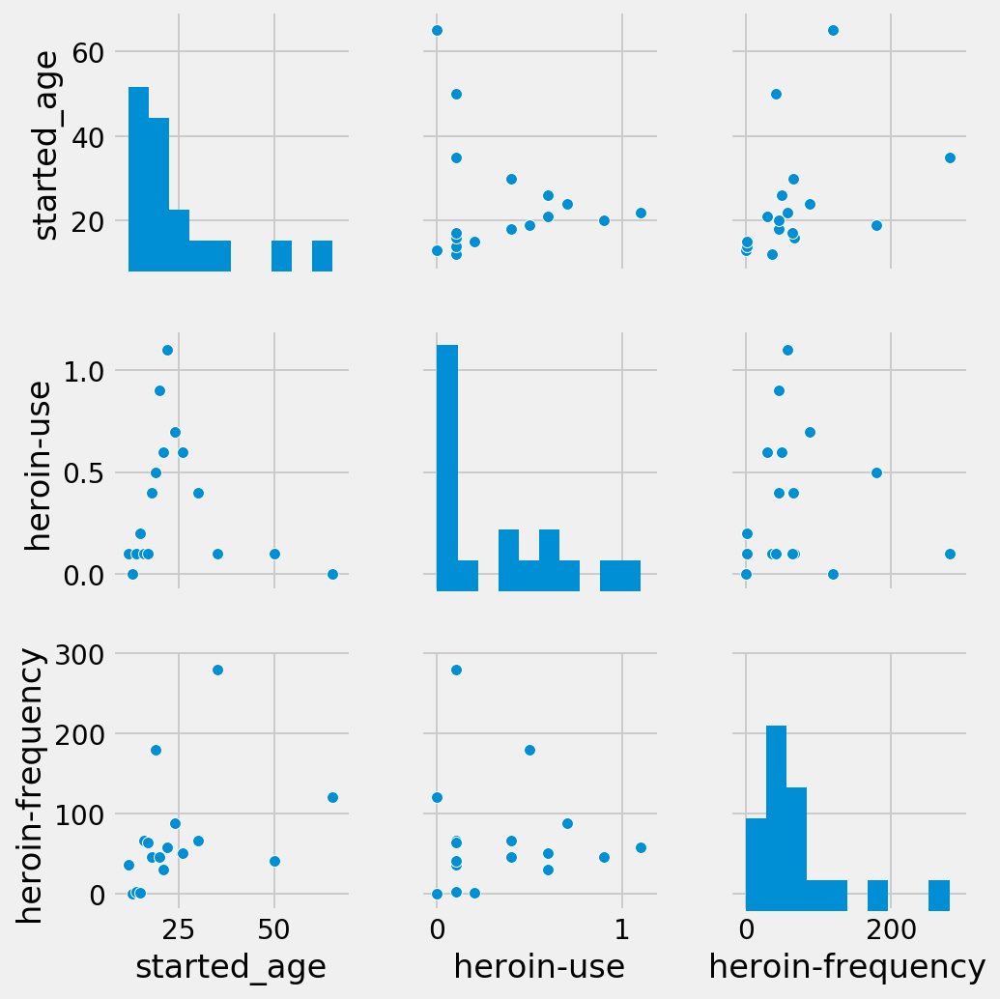

In [51]:
# Analyze the correlationship between strated_age, heroin-use and heroin-frequency

new_drug_heroin = new_drug2[['started_age','heroin-use','heroin-frequency']]

new_drug_heroin.plot(x="started_age", kind='line', title='Heroin', legend=True, figsize=(30,10))

plt.legend(loc='center left', bbox_to_anchor=(1.0, 0.5))

sns.pairplot(new_drug_heroin)

print new_drug_heroin.corr(method='pearson')

                        started_age  hallucinogen-use  hallucinogen-frequency
started_age                1.000000         -0.387573                0.099373
hallucinogen-use          -0.387573          1.000000               -0.427863
hallucinogen-frequency     0.099373         -0.427863                1.000000


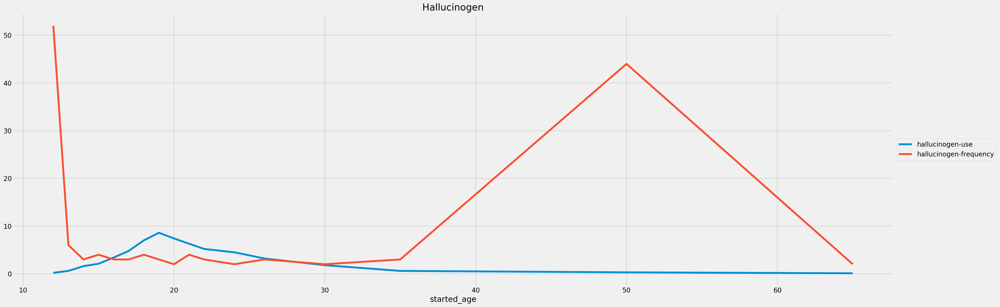

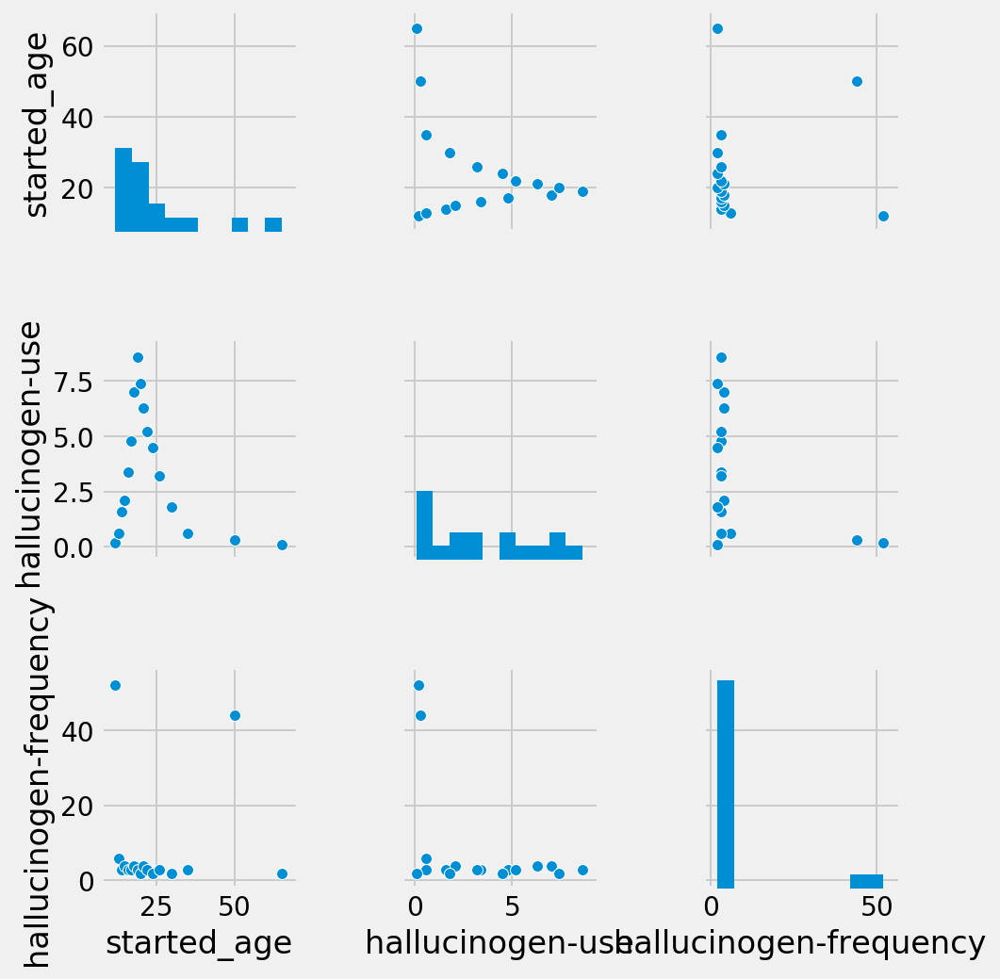

In [52]:
# Analyze the correlationship between strated_age, hallucinogen-use and hallucinogen-frequency

new_drug_hallucinogen = new_drug2[['started_age','hallucinogen-use','hallucinogen-frequency']]

new_drug_hallucinogen.plot(x="started_age", kind='line', title='Hallucinogen', legend=True, figsize=(30,10))

plt.legend(loc='center left', bbox_to_anchor=(1.0, 0.5))

sns.pairplot(new_drug_hallucinogen)

print new_drug_hallucinogen.corr(method='pearson')

                    started_age  inhalant-use  inhalant-frequency
started_age            1.000000     -0.784329           -0.128445
inhalant-use          -0.784329      1.000000            0.036979
inhalant-frequency    -0.128445      0.036979            1.000000


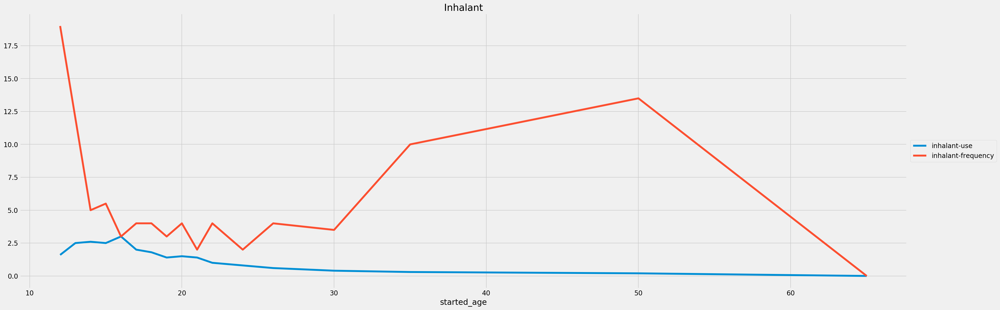

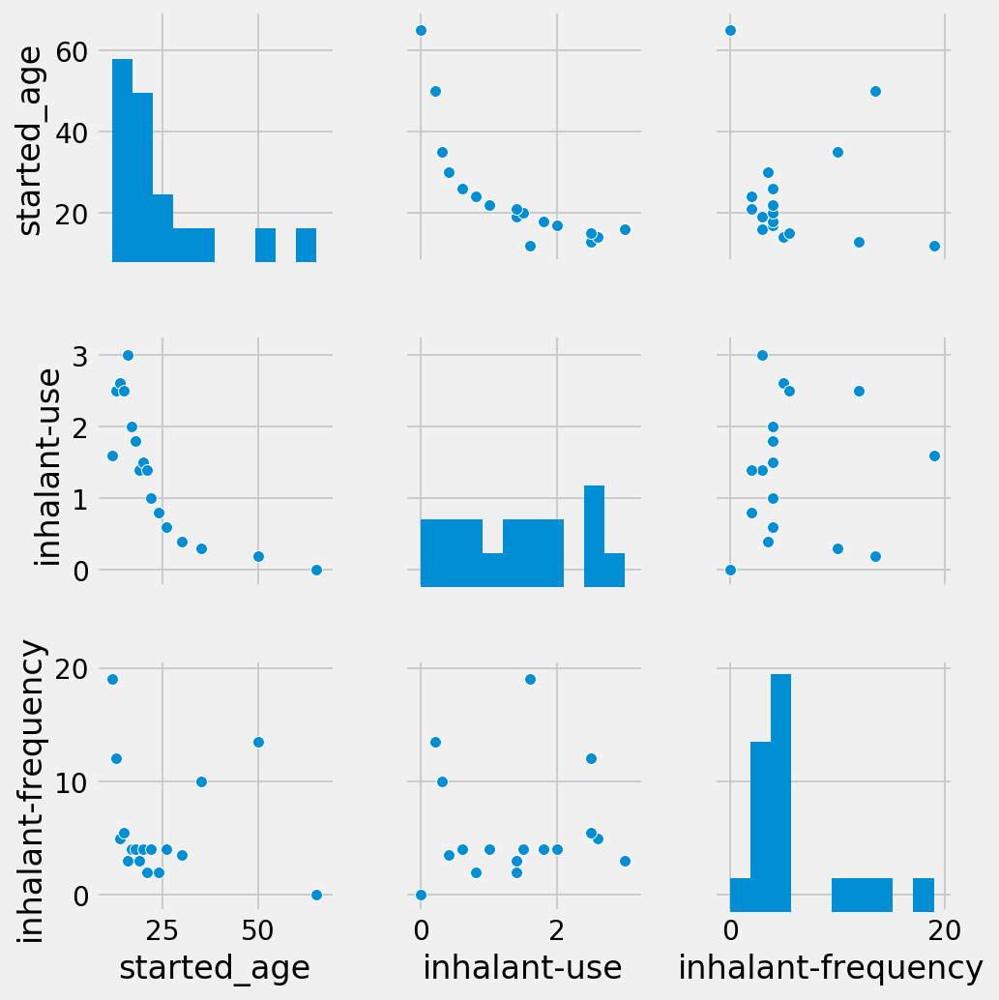

In [53]:
# Analyze the correlationship between strated_age, inhalant-use and inhalant-frequency

new_drug_inhalant = new_drug2[['started_age','inhalant-use','inhalant-frequency']]

new_drug_inhalant.plot(x="started_age", kind='line', title='Inhalant', legend=True, figsize=(30,10))

plt.legend(loc='center left', bbox_to_anchor=(1.0, 0.5))

sns.pairplot(new_drug_inhalant)

print new_drug_inhalant.corr(method='pearson')

                         started_age  pain-releiver-use  \
started_age                 1.000000          -0.429406   
pain-releiver-use          -0.429406           1.000000   
pain-releiver-frequency     0.186960          -0.468617   

                         pain-releiver-frequency  
started_age                             0.186960  
pain-releiver-use                      -0.468617  
pain-releiver-frequency                 1.000000  


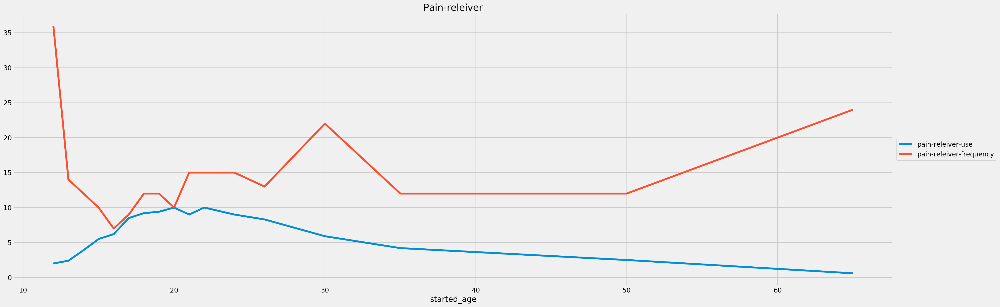

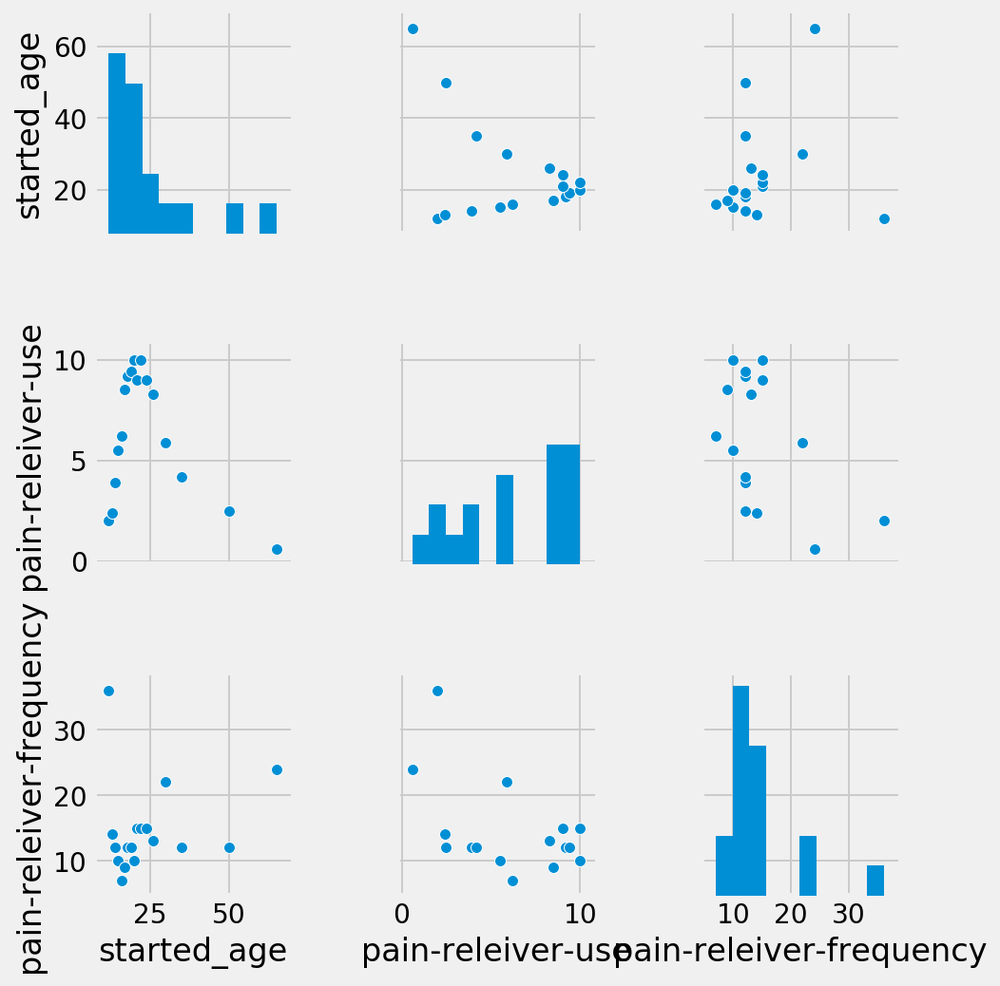

In [54]:
# Analyze the correlationship between strated_age, pain-releiver-use and pain-releiver-use-frequency

new_drug_pain_releiver = new_drug2[['started_age','pain-releiver-use','pain-releiver-frequency']]

new_drug_pain_releiver.plot(x="started_age", kind='line', title='Pain-releiver', legend=True, figsize=(30,10))

plt.legend(loc='center left', bbox_to_anchor=(1.0, 0.5))

sns.pairplot(new_drug_pain_releiver)

print new_drug_pain_releiver.corr(method='pearson')

                     started_age  oxycontin-use  oxycontin-frequency
started_age             1.000000      -0.371449            -0.225513
oxycontin-use          -0.371449       1.000000            -0.143877
oxycontin-frequency    -0.225513      -0.143877             1.000000


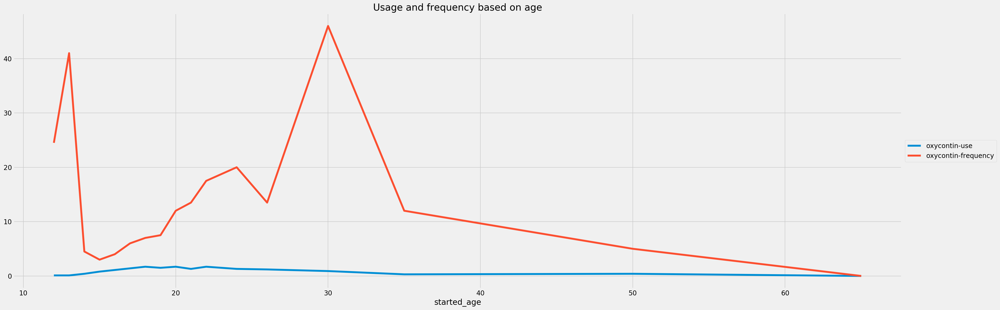

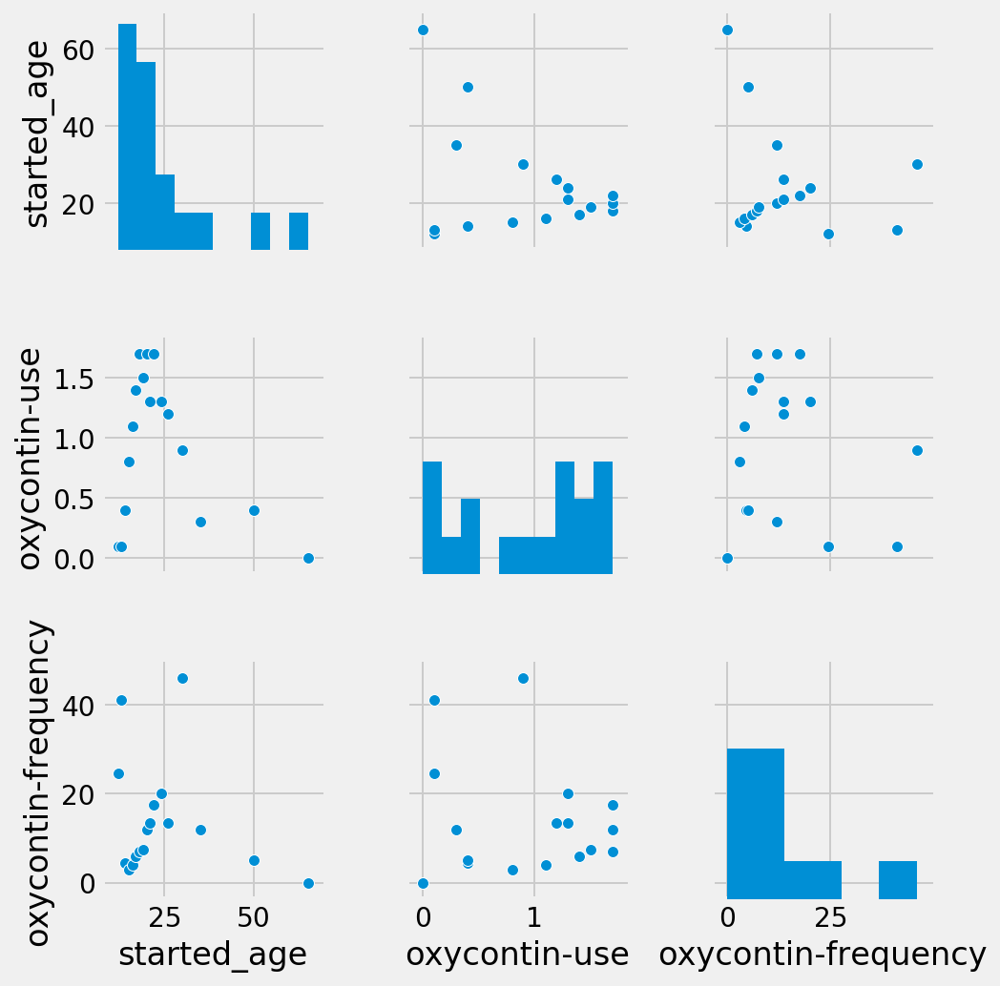

In [55]:
# Analyze the correlationship between strated_age, oxycontin-use and oxycontin-frequency

new_drug_oxycontin = new_drug2[['started_age','oxycontin-use','oxycontin-frequency']]

new_drug_oxycontin.plot(x="started_age", kind='line', title='Usage and frequency based on age', legend=True, figsize=(30,10))

plt.legend(loc='center left', bbox_to_anchor=(1.0, 0.5))

sns.pairplot(new_drug_oxycontin)

print new_drug_oxycontin.corr(method='pearson')

                        started_age  tranquilizer-use  tranquilizer-frequency
started_age                1.000000         -0.250137               -0.316679
tranquilizer-use          -0.250137          1.000000               -0.388954
tranquilizer-frequency    -0.316679         -0.388954                1.000000


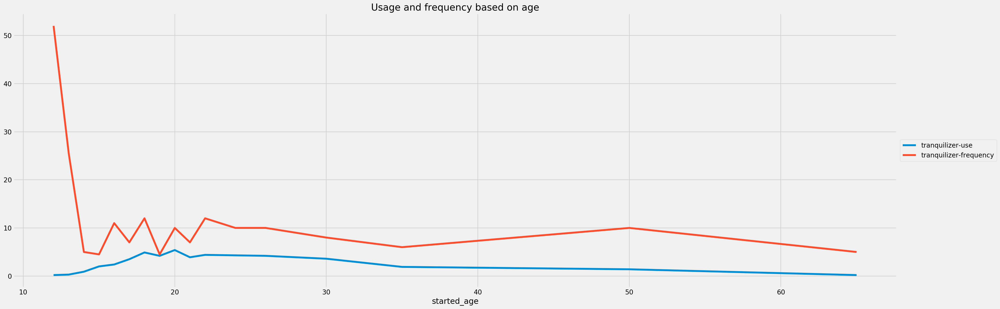

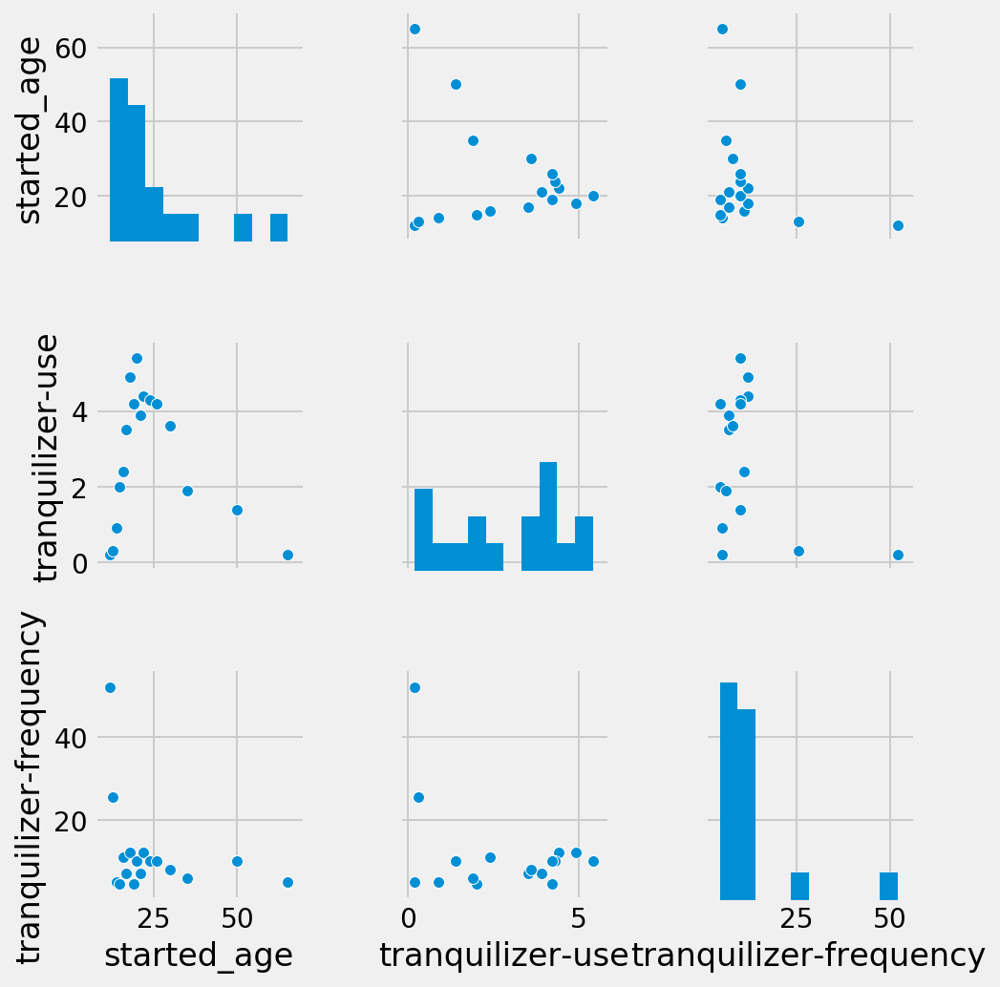

In [56]:
# Analyze the correlationship between strated_age, tranquilizer-use and tranquilizer-frequency

new_drug_tranquilizer = new_drug2[['started_age','tranquilizer-use','tranquilizer-frequency']]

new_drug_tranquilizer.plot(x="started_age", kind='line', title='Usage and frequency based on age', legend=True, figsize=(30,10))

plt.legend(loc='center left', bbox_to_anchor=(1.0, 0.5))

sns.pairplot(new_drug_tranquilizer)

print new_drug_tranquilizer.corr(method='pearson')

                     started_age  stimulant-use  stimulant-frequency
started_age             1.000000      -0.382329             0.778792
stimulant-use          -0.382329       1.000000            -0.363358
stimulant-frequency     0.778792      -0.363358             1.000000


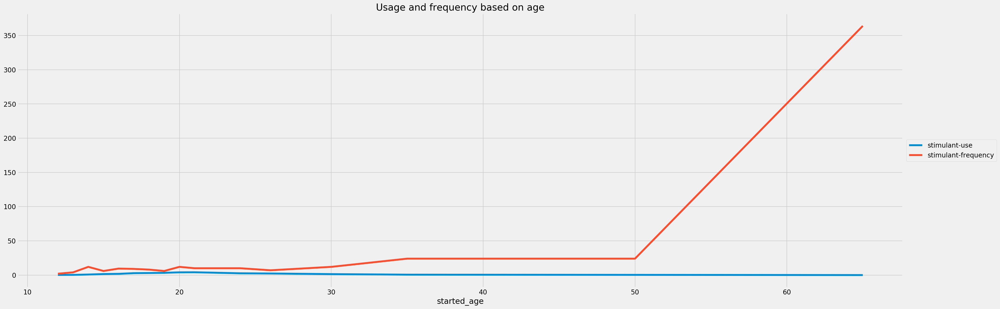

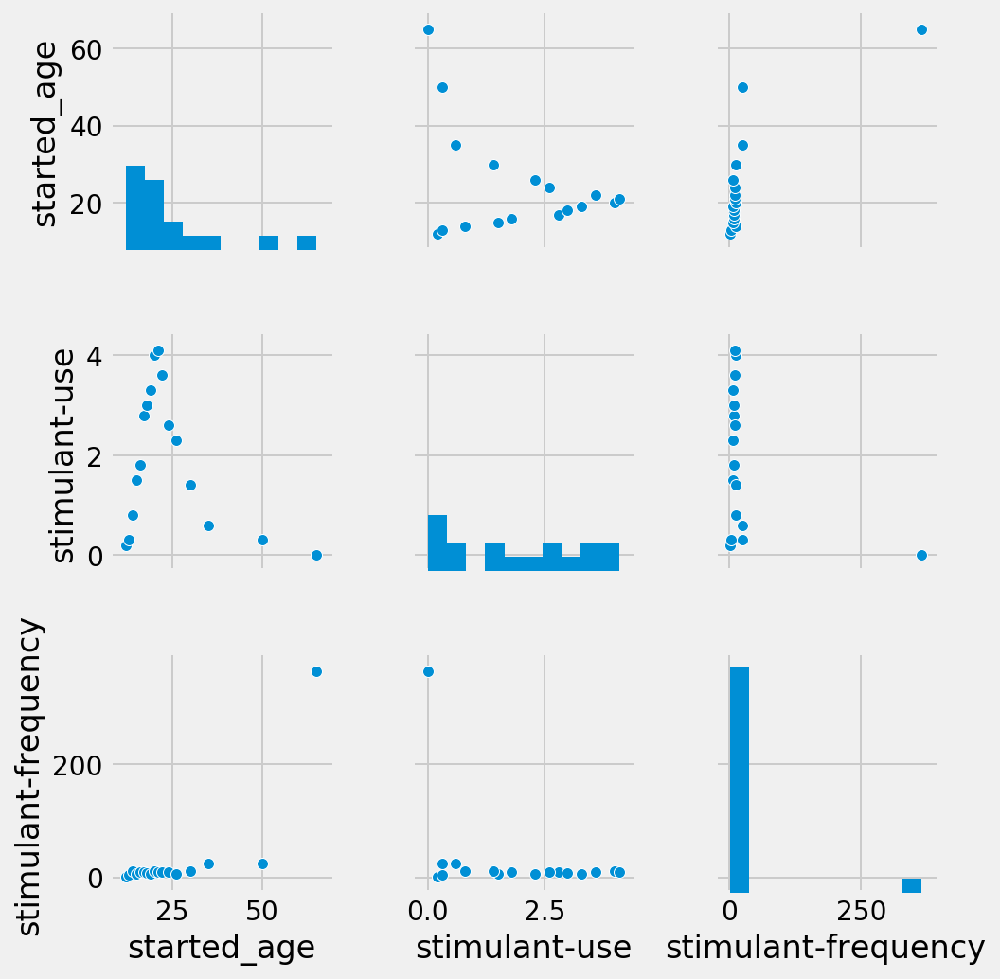

In [57]:
# Analyze the correlationship between strated_age, stimulant-use and stimulant-frequency

new_drug_stimulant = new_drug2[['started_age','stimulant-use','stimulant-frequency']]

new_drug_stimulant.plot(x="started_age", kind='line', title='Usage and frequency based on age', legend=True, figsize=(30,10))

plt.legend(loc='center left', bbox_to_anchor=(1.0, 0.5))

sns.pairplot(new_drug_stimulant)

print new_drug_stimulant.corr(method='pearson')

# from the analysis, we could see that there is high positive correlationship between age and stimulant-frequency.

                started_age  meth-use  meth-frequency
started_age        1.000000 -0.261252        0.036702
meth-use          -0.261252  1.000000        0.059605
meth-frequency     0.036702  0.059605        1.000000


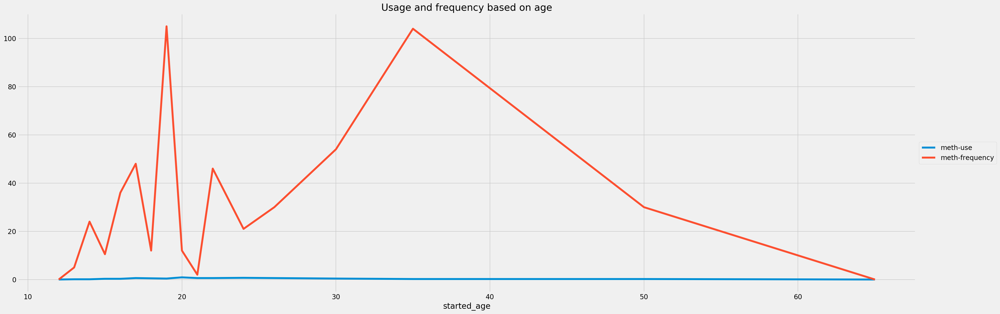

In [58]:
# Analyze the correlationship between strated_age, meth-use and meth-frequency

new_drug_meth = new_drug2[['started_age','meth-use','meth-frequency']]

new_drug_meth.plot(x="started_age", kind='line', title='Usage and frequency based on age', legend=True, figsize=(30,10))

plt.legend(loc='center left', bbox_to_anchor=(1.0, 0.5))

print new_drug_meth.corr(method='pearson')

                    started_age  sedative-use  sedative-frequency
started_age            1.000000     -0.394353            0.396722
sedative-use          -0.394353      1.000000           -0.284234
sedative-frequency     0.396722     -0.284234            1.000000


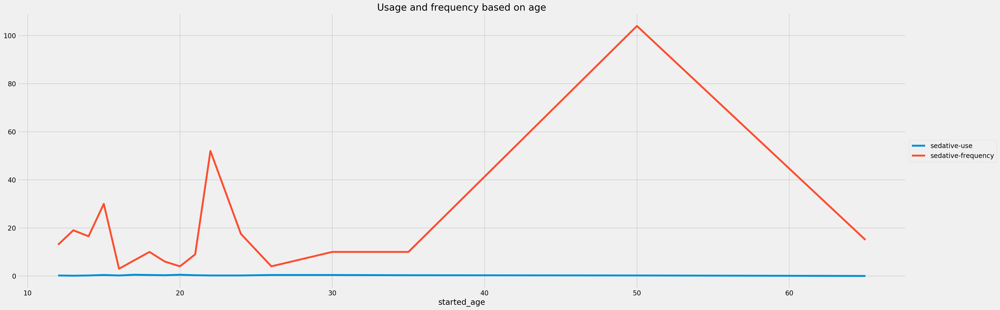

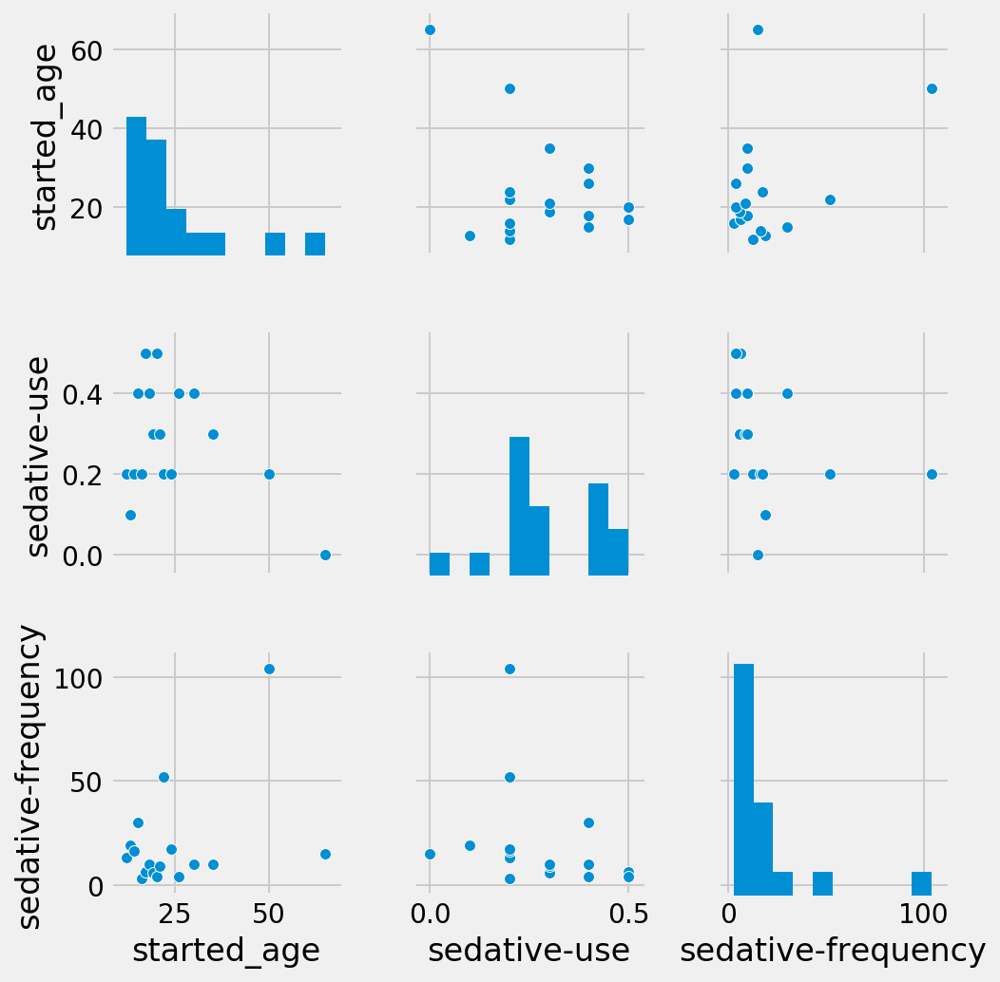

In [59]:
# Analyze the correlationship between strated_age, sedative-use and sedative-frequency

new_drug_sedative = new_drug2[['started_age','sedative-use','sedative-frequency']]

new_drug_sedative.plot(x="started_age", kind='line', title='Usage and frequency based on age', legend=True, figsize=(30,10))

plt.legend(loc='center left', bbox_to_anchor=(1.0, 0.5))

sns.pairplot(new_drug_sedative)

print new_drug_sedative.corr(method='pearson')

**Conclusion:**
Overall, there are no much evidence to show that there is much relationship between use and frequency of drugs other than alcohol use and alcohol frequency.

**From the heatmap, we could realize there are some pattern below.**

                   started_age  hallucinogen-use  pain-releiver-use  \
started_age           1.000000         -0.387573          -0.429406   
hallucinogen-use     -0.387573          1.000000           0.909333   
pain-releiver-use    -0.429406          0.909333           1.000000   
oxycontin-use        -0.371449          0.916777           0.976445   
tranquilizer-use     -0.250137          0.862900           0.959283   
stimulant-use        -0.382329          0.940008           0.961484   
meth-use             -0.261252          0.780071           0.918051   
marijuana-use        -0.365037          0.959353           0.966226   

                   oxycontin-use  tranquilizer-use  stimulant-use  meth-use  \
started_age            -0.371449         -0.250137      -0.382329 -0.261252   
hallucinogen-use        0.916777          0.862900       0.940008  0.780071   
pain-releiver-use       0.976445          0.959283       0.961484  0.918051   
oxycontin-use           1.000000          0.

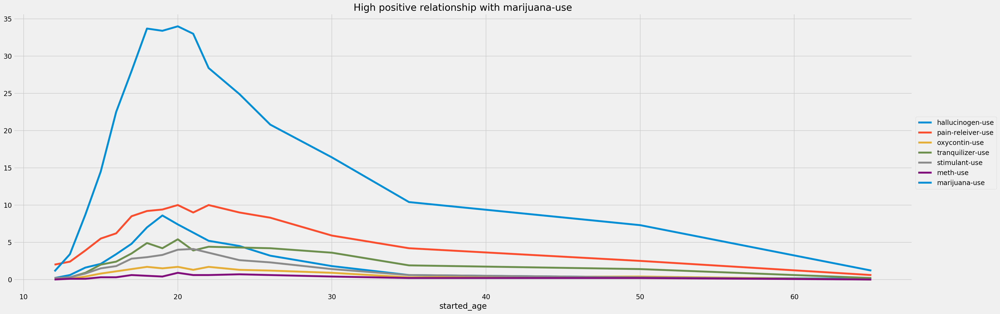

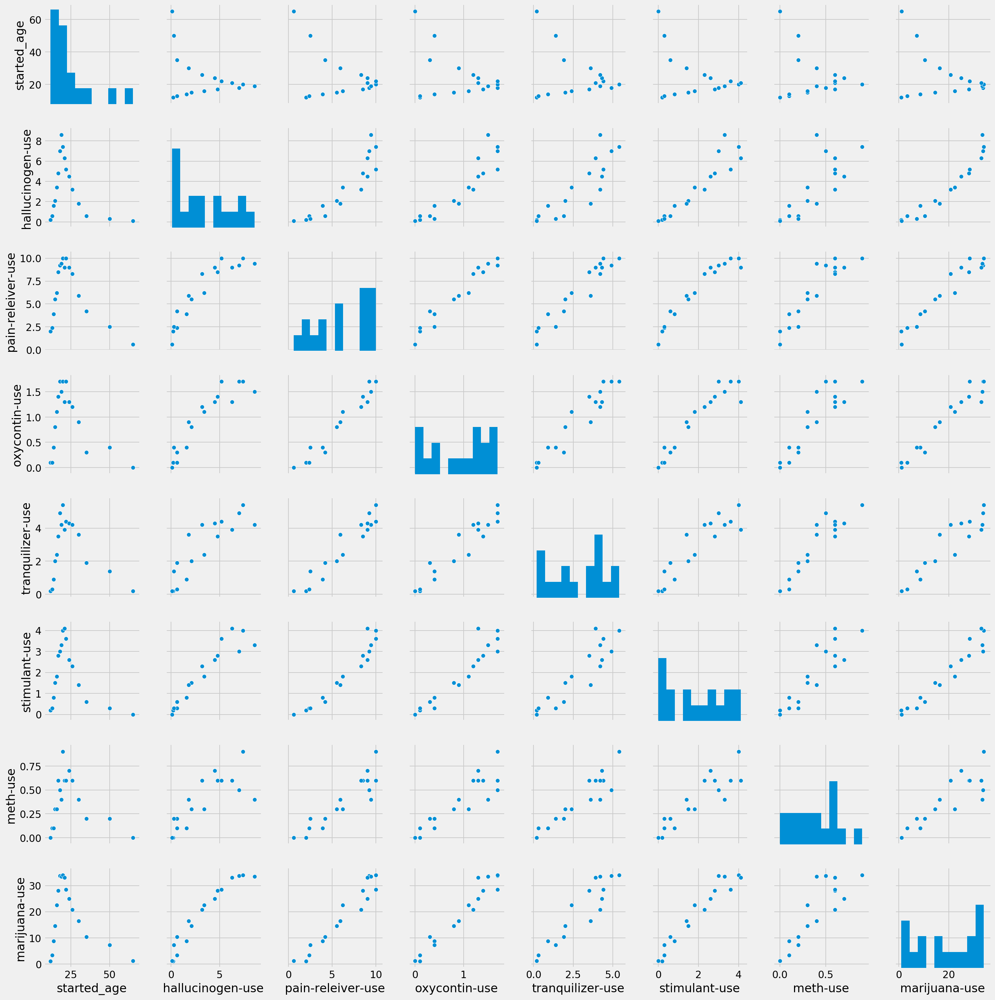

In [60]:
# The drugs below showed high positive correlationship with 'marijuana-use' which mean those who use marijuana would highly probable consume certain drugs

new_drug_marijuana_use = new_drug2[['started_age','hallucinogen-use','pain-releiver-use', 'oxycontin-use','tranquilizer-use', 'stimulant-use', 'meth-use', 'marijuana-use']]

new_drug_marijuana_use.plot(x="started_age", kind='line', title='High positive relationship with marijuana-use', legend=True, figsize=(30,10))

plt.legend(loc='center left', bbox_to_anchor=(1.0, 0.5))

sns.pairplot(new_drug_marijuana_use)

print new_drug_marijuana_use.corr(method='pearson')



                     started_age  crack-use  alcohol-use  marijuana-frequency
started_age             1.000000   0.106592     0.347178             0.296227
crack-use               0.106592   1.000000     0.877378             0.892077
alcohol-use             0.347178   0.877378     1.000000             0.920425
marijuana-frequency     0.296227   0.892077     0.920425             1.000000


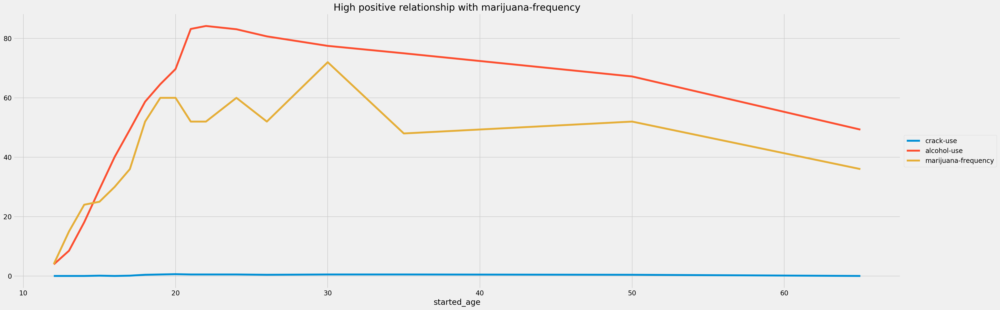

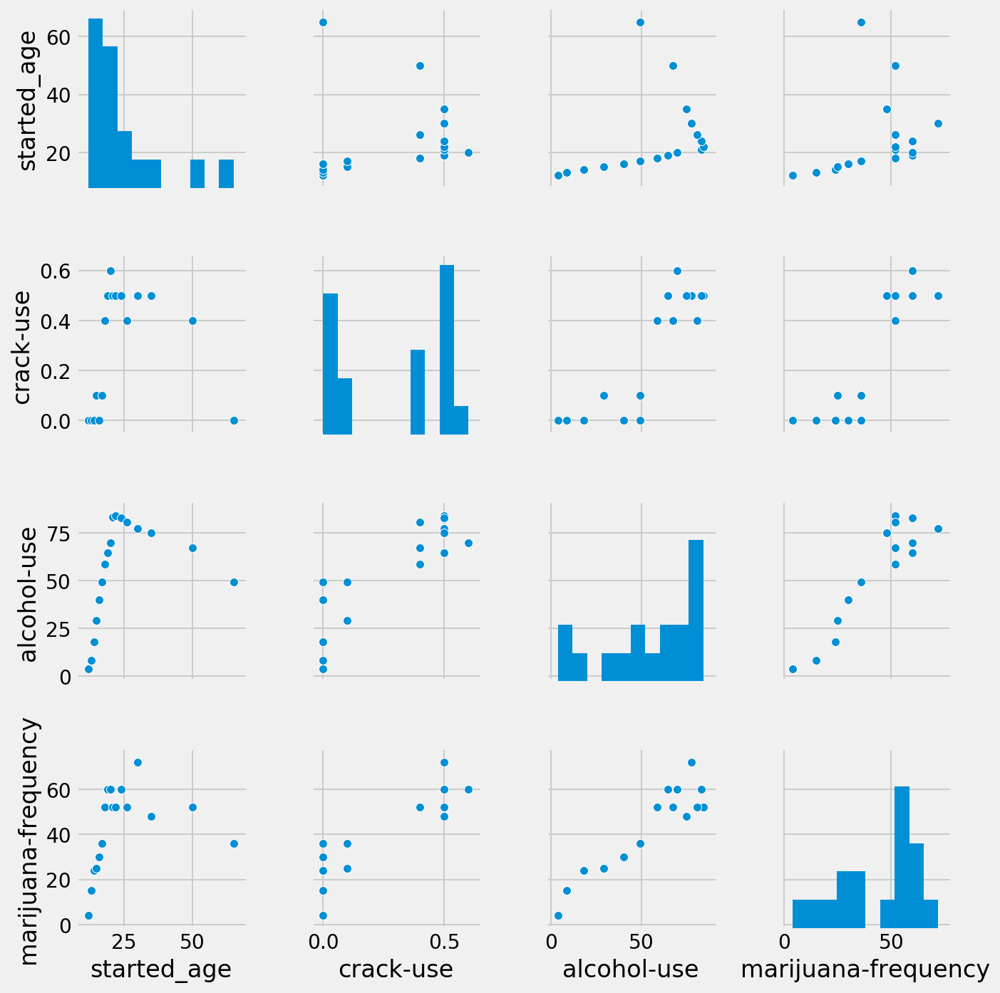

In [61]:
# The drugs below showed high positive correlationship with 'marijuana-frequency' which mean those who use marijuana would highly probable consume certain drugs

new_drug_marijuana_frequency = new_drug2[['started_age','crack-use','alcohol-use', 'marijuana-frequency']]

new_drug_marijuana_frequency.plot(x="started_age", kind='line', title='High positive relationship with marijuana-frequency', legend=True, figsize=(30,10))

plt.legend(loc='center left', bbox_to_anchor=(1.0, 0.5))

sns.pairplot(new_drug_marijuana_frequency)

print new_drug_marijuana_frequency.corr(method='pearson')

                  started_age  hallucinogen-use  marijuana-use  heroin-use  \
started_age          1.000000         -0.387573      -0.365037   -0.184835   
hallucinogen-use    -0.387573          1.000000       0.959353    0.683674   
marijuana-use       -0.365037          0.959353       1.000000    0.711613   
heroin-use          -0.184835          0.683674       0.711613    1.000000   
tranquilizer-use    -0.250137          0.862900       0.935199    0.818583   
stimulant-use       -0.382329          0.940008       0.968096    0.808024   
meth-use            -0.261252          0.780071       0.870446    0.816620   
cocaine-use         -0.179095          0.855668       0.883789    0.899944   

                  tranquilizer-use  stimulant-use  meth-use  cocaine-use  
started_age              -0.250137      -0.382329 -0.261252    -0.179095  
hallucinogen-use          0.862900       0.940008  0.780071     0.855668  
marijuana-use             0.935199       0.968096  0.870446     0.883789

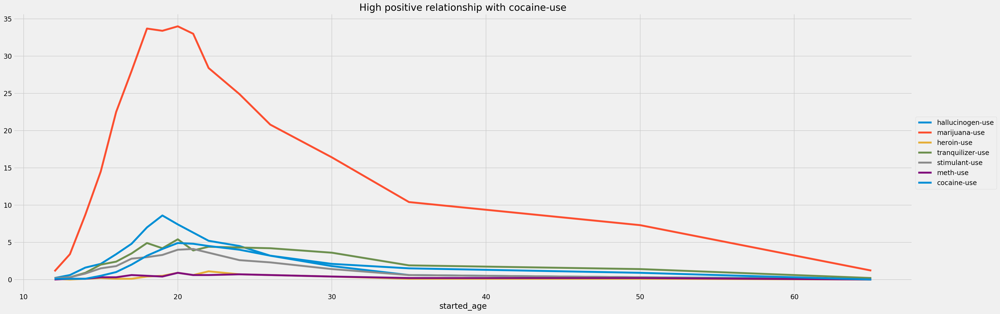

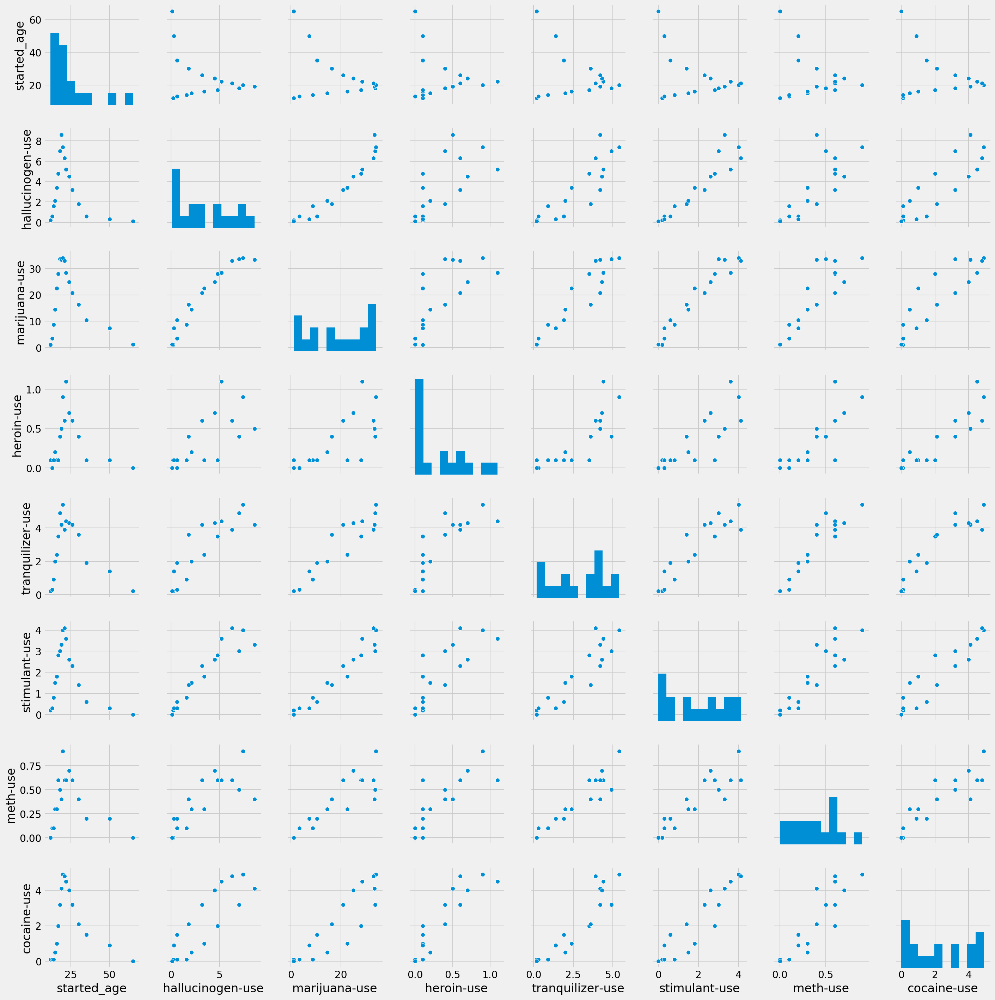

In [62]:
# The drugs below showed high positive correlationship with 'cocaine-use' which mean those who use cocaine would highly probable consume certain drugs

new_drug_cocaine_use = new_drug2[['started_age','hallucinogen-use','marijuana-use', 'heroin-use','tranquilizer-use', 'stimulant-use', 'meth-use', 'cocaine-use']]

new_drug_cocaine_use.plot(x="started_age", kind='line', title='High positive relationship with cocaine-use', legend=True, figsize=(30,10))

plt.legend(loc='center left', bbox_to_anchor=(1.0, 0.5))

sns.pairplot(new_drug_cocaine_use)

print new_drug_cocaine_use.corr(method='pearson')

                   started_age  crack-frequency  cocaine-frequency
started_age           1.000000         0.436867            0.40207
crack-frequency       0.436867         1.000000            0.87226
cocaine-frequency     0.402070         0.872260            1.00000


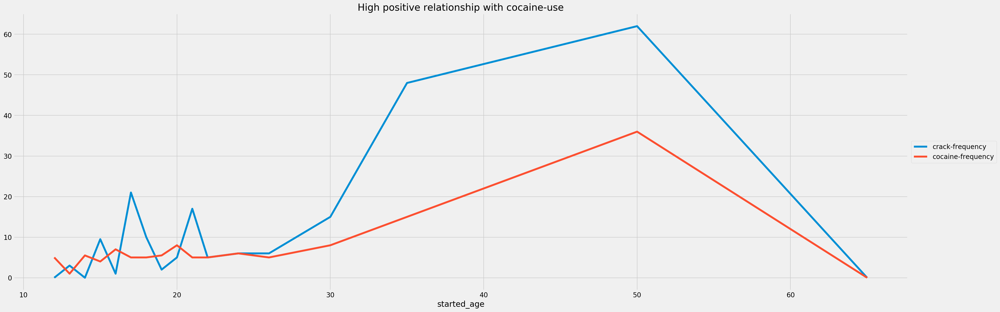

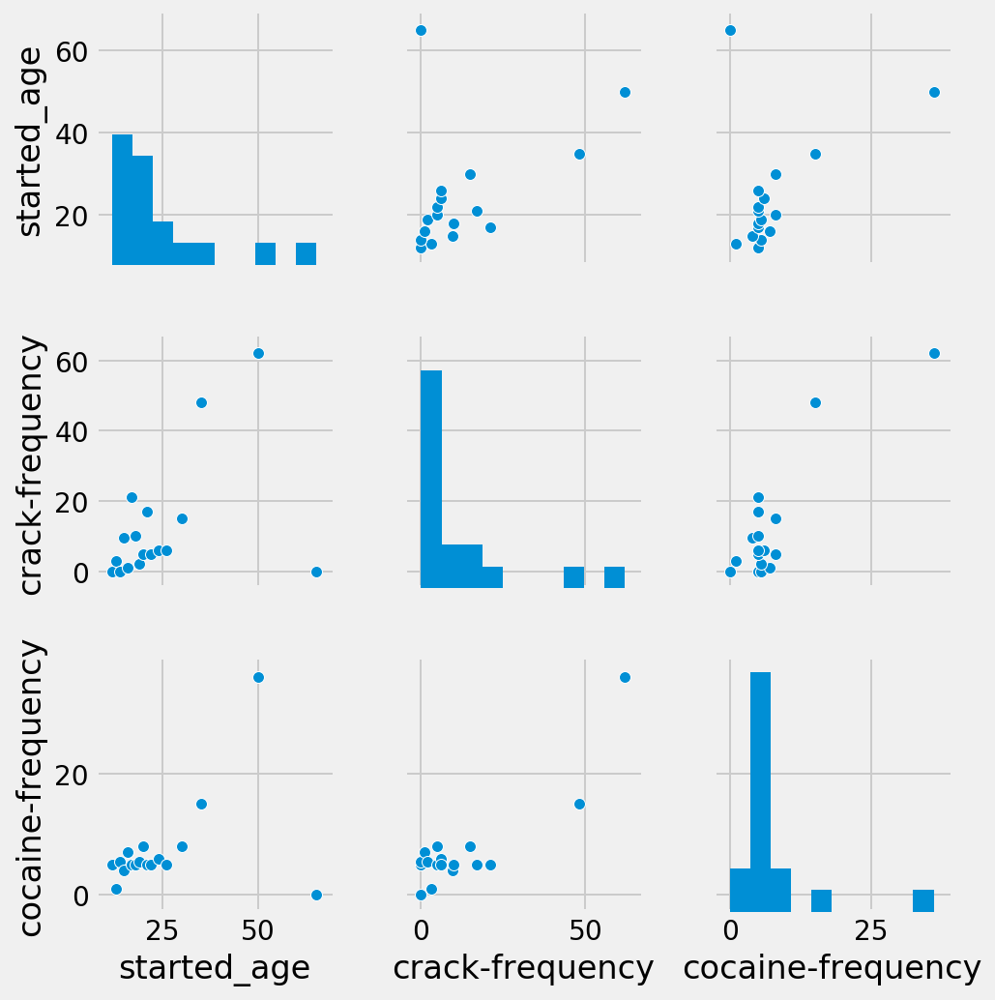

In [63]:
# The drugs below showed high positive correlationship with 'cocaine-frequency' which mean those who use cocaine would highly probable consume certain drugs

new_drug_cocaine_frequency = new_drug2[['started_age','crack-frequency','cocaine-frequency']]

new_drug_cocaine_frequency.plot(x="started_age", kind='line', title='High positive relationship with cocaine-use', legend=True, figsize=(30,10))

plt.legend(loc='center left', bbox_to_anchor=(1.0, 0.5))

sns.pairplot(new_drug_cocaine_frequency)

print new_drug_cocaine_frequency.corr(method='pearson')


                   started_age  pain-releiver-use  marijuana-use  \
started_age           1.000000          -0.429406      -0.365037   
pain-releiver-use    -0.429406           1.000000       0.966226   
marijuana-use        -0.365037           0.966226       1.000000   
oxycontin-use        -0.371449           0.976445       0.971733   
tranquilizer-use     -0.250137           0.959283       0.935199   
stimulant-use        -0.382329           0.961484       0.968096   
meth-use             -0.261252           0.918051       0.870446   
cocaine-use          -0.179095           0.906638       0.883789   
hallucinogen-use     -0.387573           0.909333       0.959353   

                   oxycontin-use  tranquilizer-use  stimulant-use  meth-use  \
started_age            -0.371449         -0.250137      -0.382329 -0.261252   
pain-releiver-use       0.976445          0.959283       0.961484  0.918051   
marijuana-use           0.971733          0.935199       0.968096  0.870446   
oxy

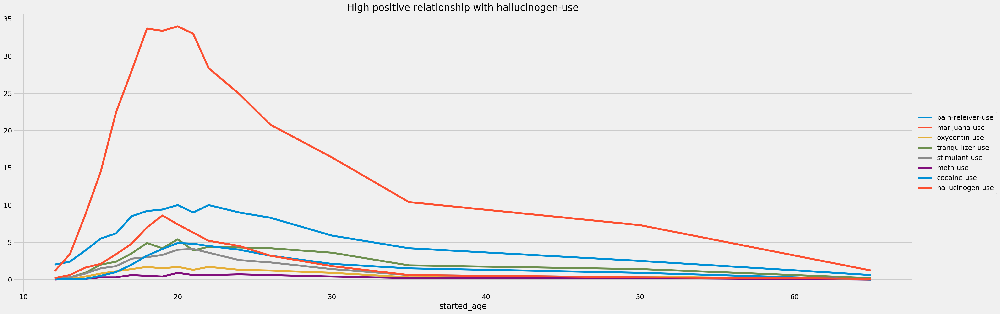

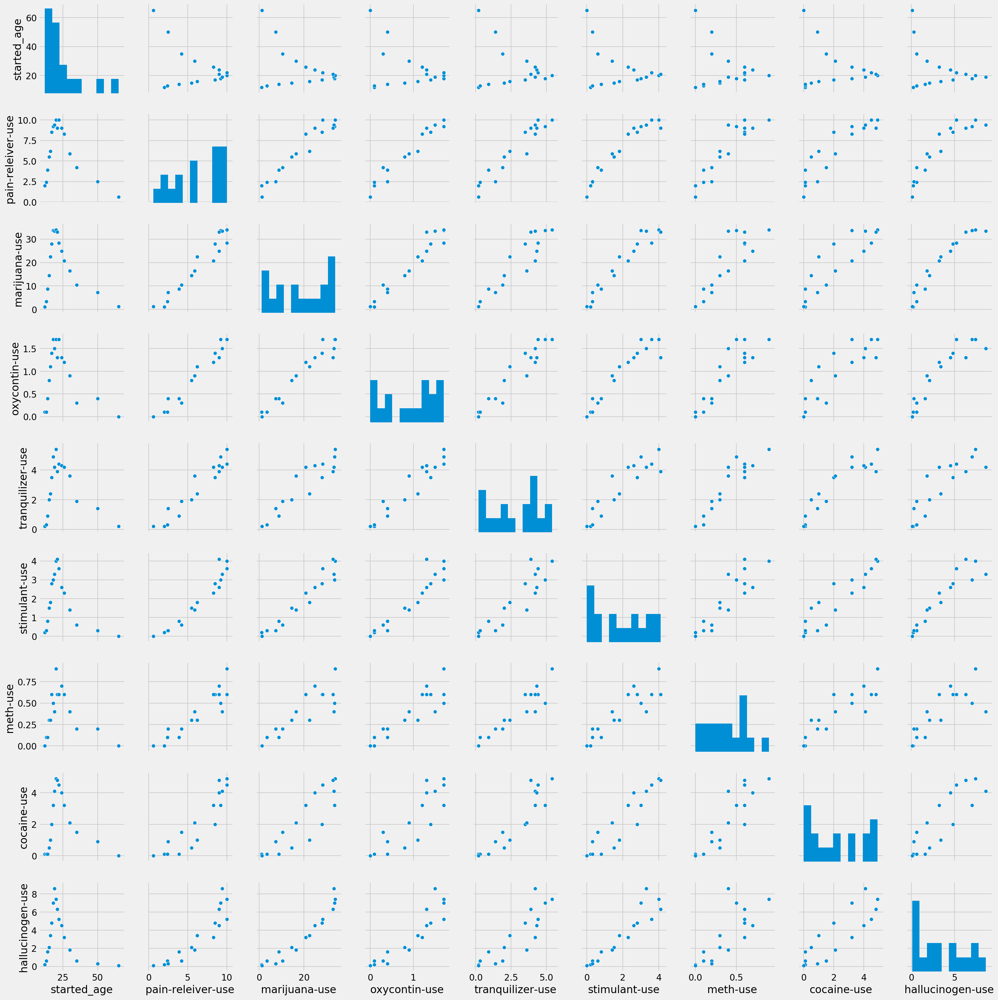

In [64]:
# The drugs below showed high positive correlationship with 'hallucinogen-use' which mean those who use hallucinogen would highly probable consume certain drugs

new_drug_hallucinogen_use = new_drug2[['started_age', 'pain-releiver-use', 'marijuana-use', 'oxycontin-use','tranquilizer-use', 'stimulant-use', 'meth-use', 'cocaine-use', 'hallucinogen-use']]

new_drug_hallucinogen_use.plot(x="started_age", kind='line', title='High positive relationship with hallucinogen-use', legend=True, figsize=(30,10))

plt.legend(loc='center left', bbox_to_anchor=(1.0, 0.5))

sns.pairplot(new_drug_hallucinogen_use)

print new_drug_hallucinogen_use.corr(method='pearson')


                        started_age  inhalant-frequency  \
started_age                1.000000           -0.128445   
inhalant-frequency        -0.128445            1.000000   
hallucinogen-frequency     0.099373            0.834993   

                        hallucinogen-frequency  
started_age                           0.099373  
inhalant-frequency                    0.834993  
hallucinogen-frequency                1.000000  


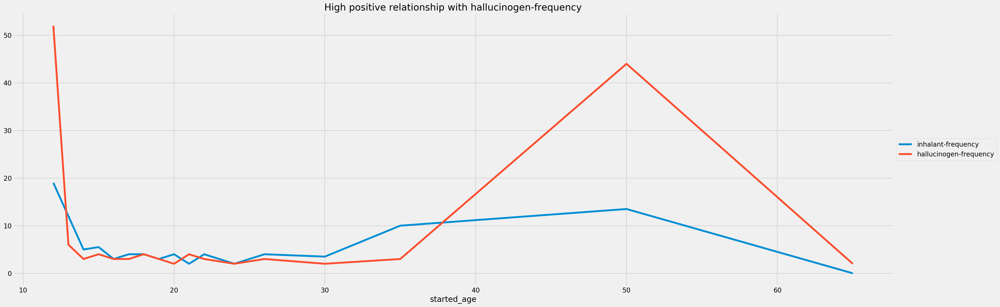

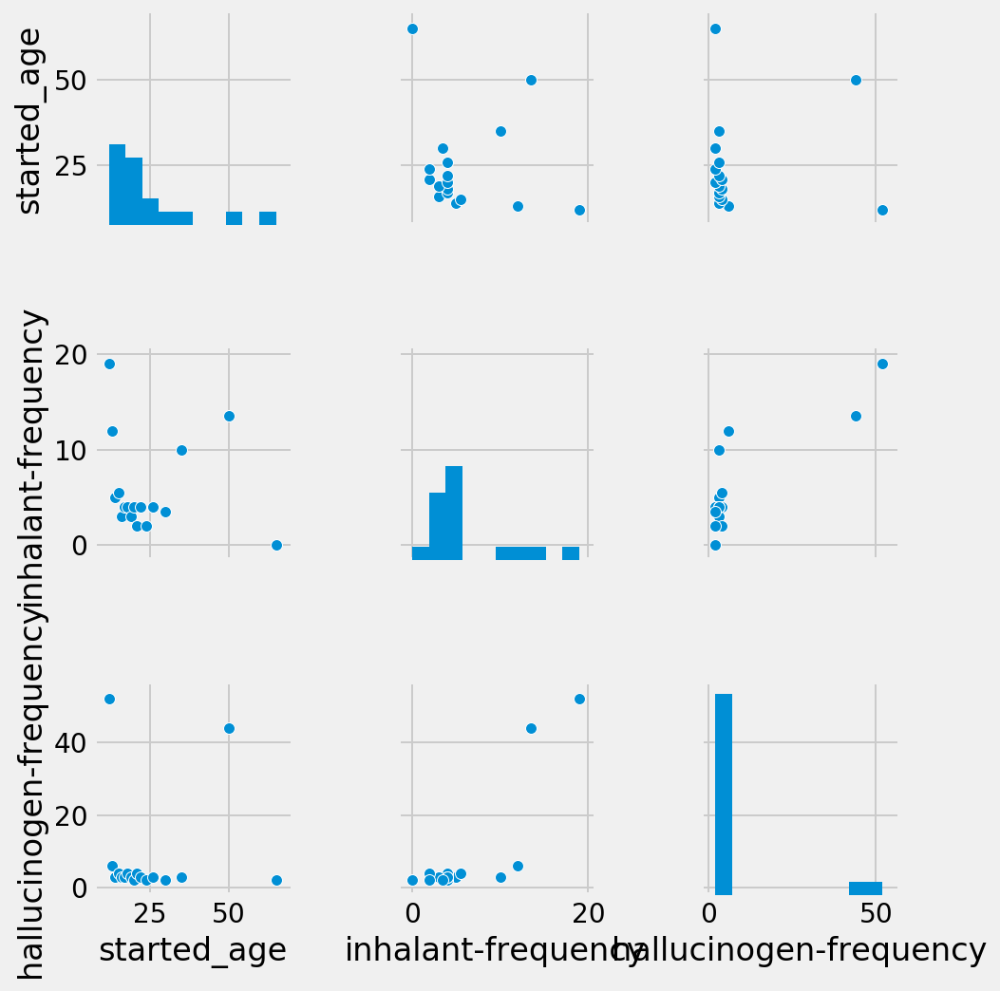

In [65]:
# The drugs below showed high positive correlationship with 'hallucinogen-frequency' which mean those who use hallucinogen would highly probable consume certain drugs

new_drug_hallucinogen_frequency = new_drug2[['started_age', 'inhalant-frequency', 'hallucinogen-frequency']]

new_drug_hallucinogen_frequency.plot(x="started_age", kind='line', title='High positive relationship with hallucinogen-frequency', legend=True, figsize=(30,10))

plt.legend(loc='center left', bbox_to_anchor=(1.0, 0.5))

sns.pairplot(new_drug_hallucinogen_frequency)

print new_drug_hallucinogen_frequency.corr(method='pearson')

                   started_age  marijuana-use  oxycontin-use  \
started_age           1.000000      -0.365037      -0.371449   
marijuana-use        -0.365037       1.000000       0.971733   
oxycontin-use        -0.371449       0.971733       1.000000   
tranquilizer-use     -0.250137       0.935199       0.955081   
stimulant-use        -0.382329       0.968096       0.947492   
meth-use             -0.261252       0.870446       0.895790   
hallucinogen-use     -0.387573       0.959353       0.916777   
heroin-use           -0.184835       0.711613       0.775321   
pain-releiver-use    -0.429406       0.966226       0.976445   

                   tranquilizer-use  stimulant-use  meth-use  \
started_age               -0.250137      -0.382329 -0.261252   
marijuana-use              0.935199       0.968096  0.870446   
oxycontin-use              0.955081       0.947492  0.895790   
tranquilizer-use           1.000000       0.909784  0.936270   
stimulant-use              0.909784    

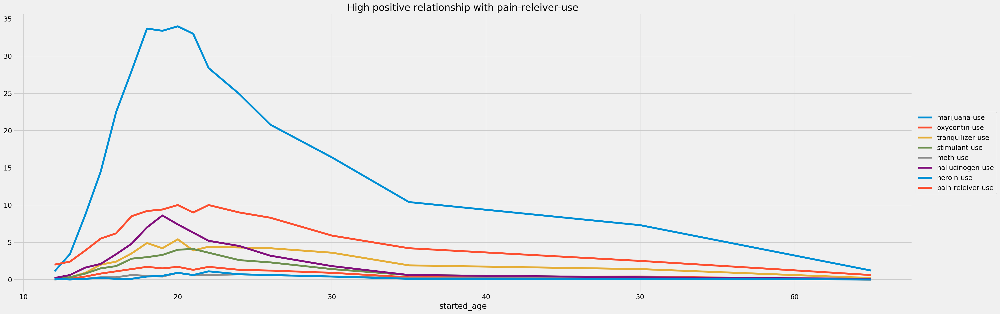

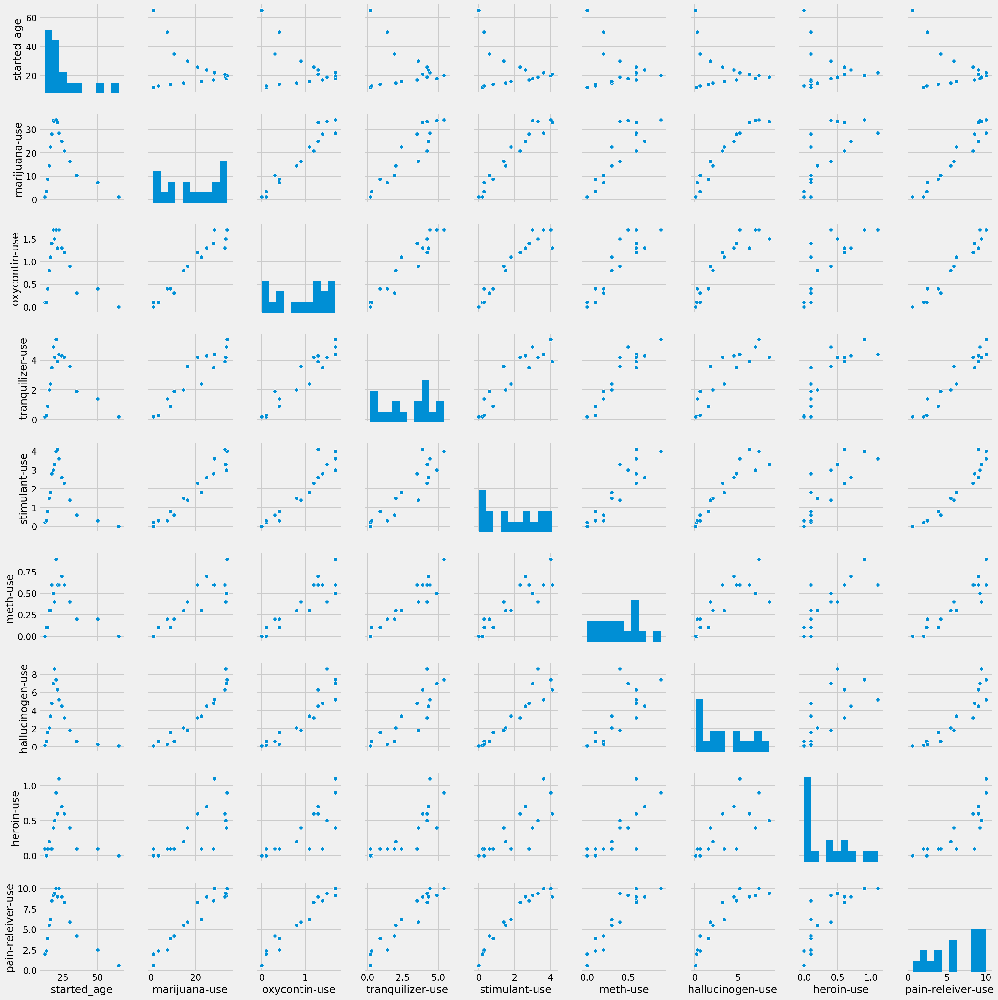

In [66]:
# The drugs below showed high positive correlationship with 'pain-releiver-use' which mean those who use pain-releiver would highly probable consume certain drugs

new_drug_pain_releiver_use = new_drug2[['started_age', 'marijuana-use', 'oxycontin-use','tranquilizer-use', 'stimulant-use', 'meth-use', 'hallucinogen-use', 'heroin-use', 'pain-releiver-use']]

new_drug_pain_releiver_use.plot(x="started_age", kind='line', title='High positive relationship with pain-releiver-use', legend=True, figsize=(30,10))

plt.legend(loc='center left', bbox_to_anchor=(1.0, 0.5))

sns.pairplot(new_drug_pain_releiver_use)

print new_drug_pain_releiver_use.corr(method='pearson')

                   started_age  marijuana-use  tranquilizer-use  \
started_age           1.000000      -0.365037         -0.250137   
marijuana-use        -0.365037       1.000000          0.935199   
tranquilizer-use     -0.250137       0.935199          1.000000   
stimulant-use        -0.382329       0.968096          0.909784   
meth-use             -0.261252       0.870446          0.936270   
hallucinogen-use     -0.387573       0.959353          0.862900   
heroin-use           -0.184835       0.711613          0.818583   
pain-releiver-use    -0.429406       0.966226          0.959283   
oxycontin-use        -0.371449       0.971733          0.955081   

                   stimulant-use  meth-use  hallucinogen-use  heroin-use  \
started_age            -0.382329 -0.261252         -0.387573   -0.184835   
marijuana-use           0.968096  0.870446          0.959353    0.711613   
tranquilizer-use        0.909784  0.936270          0.862900    0.818583   
stimulant-use           1

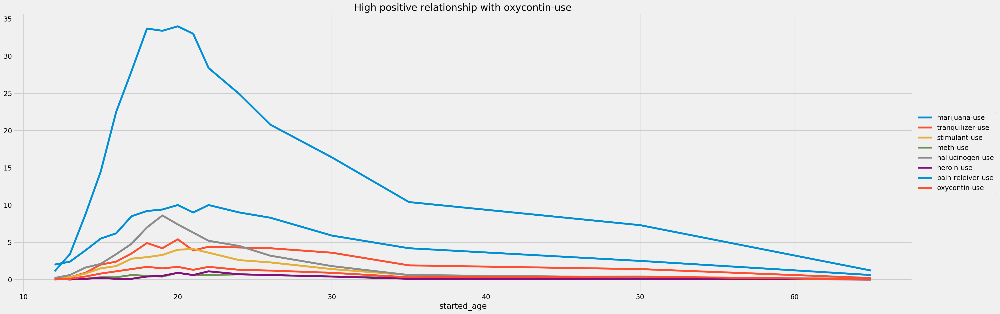

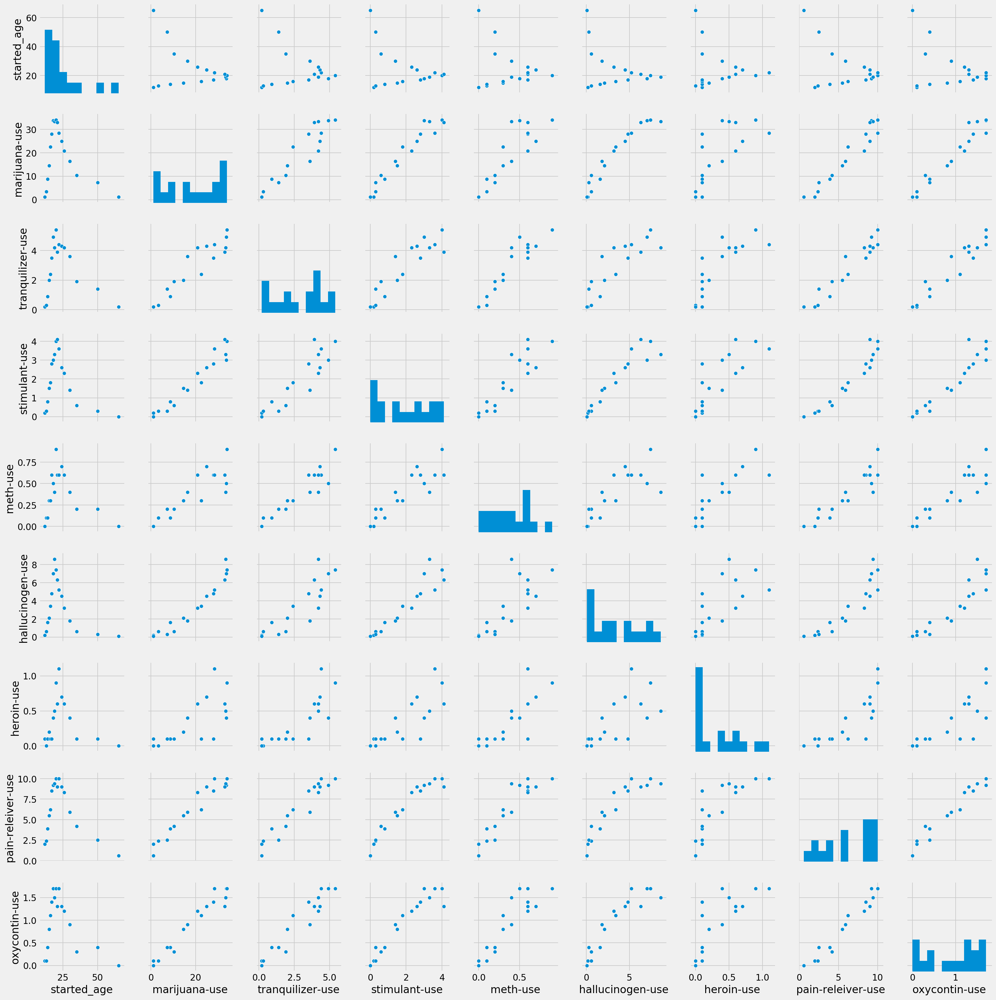

In [67]:
# The drugs below showed high positive correlationship with 'oxycontin-use' which mean those who use oxycontin would highly probable consume certain drugs

new_drug_pain_oxycontin_use = new_drug2[['started_age', 'marijuana-use','tranquilizer-use', 'stimulant-use', 'meth-use', 'hallucinogen-use', 'heroin-use', 'pain-releiver-use', 'oxycontin-use']]

new_drug_pain_oxycontin_use.plot(x="started_age", kind='line', title='High positive relationship with oxycontin-use', legend=True, figsize=(30,10))

plt.legend(loc='center left', bbox_to_anchor=(1.0, 0.5))

sns.pairplot(new_drug_pain_oxycontin_use)

print new_drug_pain_oxycontin_use.corr(method='pearson')


                   started_age  marijuana-use  stimulant-use  meth-use  \
started_age           1.000000      -0.365037      -0.382329 -0.261252   
marijuana-use        -0.365037       1.000000       0.968096  0.870446   
stimulant-use        -0.382329       0.968096       1.000000  0.894757   
meth-use             -0.261252       0.870446       0.894757  1.000000   
hallucinogen-use     -0.387573       0.959353       0.940008  0.780071   
heroin-use           -0.184835       0.711613       0.808024  0.816620   
pain-releiver-use    -0.429406       0.966226       0.961484  0.918051   
cocaine-use          -0.179095       0.883789       0.923954  0.889353   
oxycontin-use        -0.371449       0.971733       0.947492  0.895790   
tranquilizer-use     -0.250137       0.935199       0.909784  0.936270   

                   hallucinogen-use  heroin-use  pain-releiver-use  \
started_age               -0.387573   -0.184835          -0.429406   
marijuana-use              0.959353    0.7116

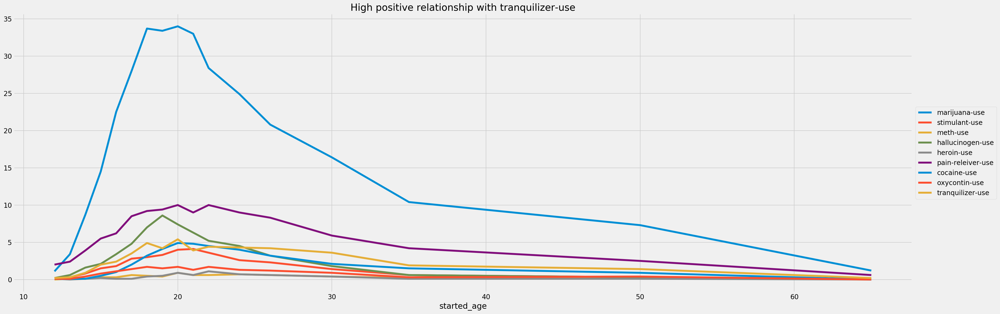

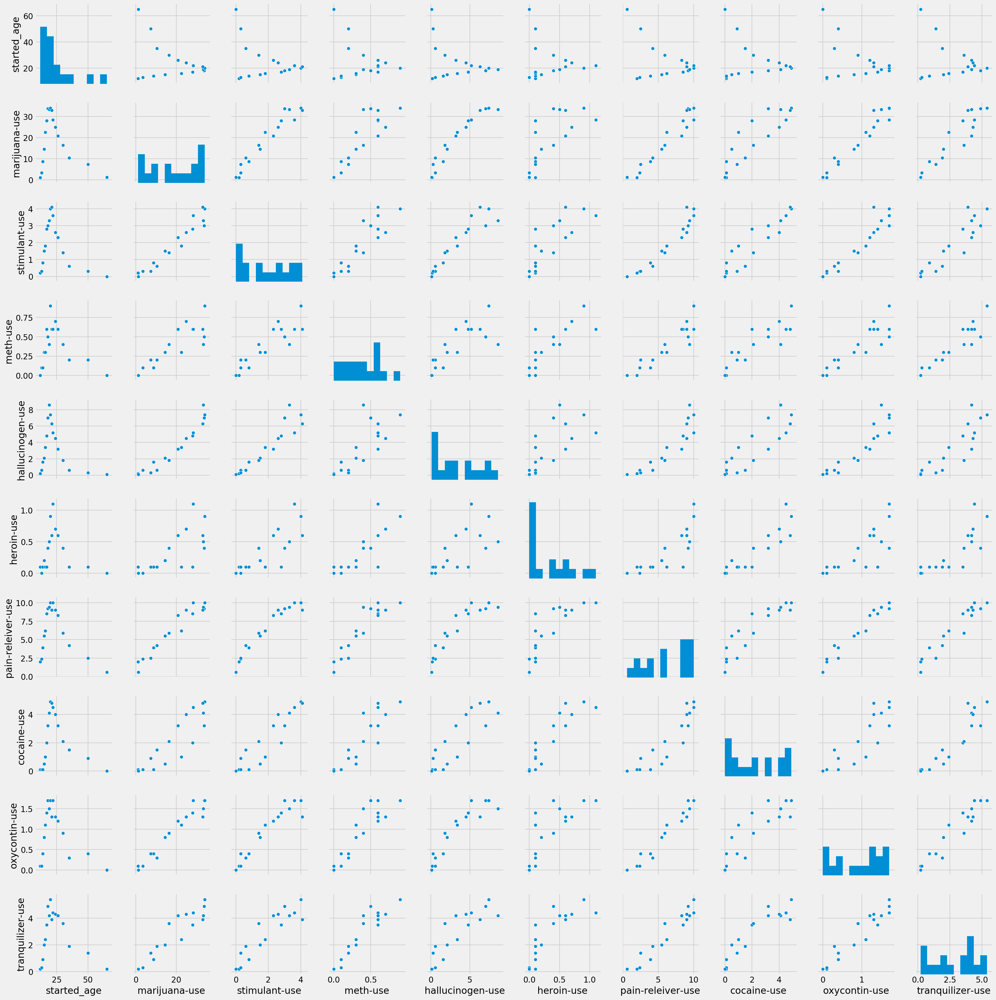

In [68]:
# The drugs below showed high positive correlationship with 'tranquilizer-use' which mean those who use tranquilizer would highly probable consume certain drugs

new_drug_tranquilizer_use = new_drug2[['started_age', 'marijuana-use', 'stimulant-use', 'meth-use', 'hallucinogen-use', 'heroin-use', 'pain-releiver-use', 'cocaine-use', 'oxycontin-use', 'tranquilizer-use']]

new_drug_tranquilizer_use.plot(x="started_age", kind='line', title='High positive relationship with tranquilizer-use', legend=True, figsize=(30,10))

plt.legend(loc='center left', bbox_to_anchor=(1.0, 0.5))

sns.pairplot(new_drug_tranquilizer_use)

print new_drug_tranquilizer_use.corr(method='pearson')

**Negative corelationship

                   started_age  inhalant-use  alcohol-frequency
started_age           1.000000     -0.784329           0.629531
inhalant-use         -0.784329      1.000000          -0.864153
alcohol-frequency     0.629531     -0.864153           1.000000


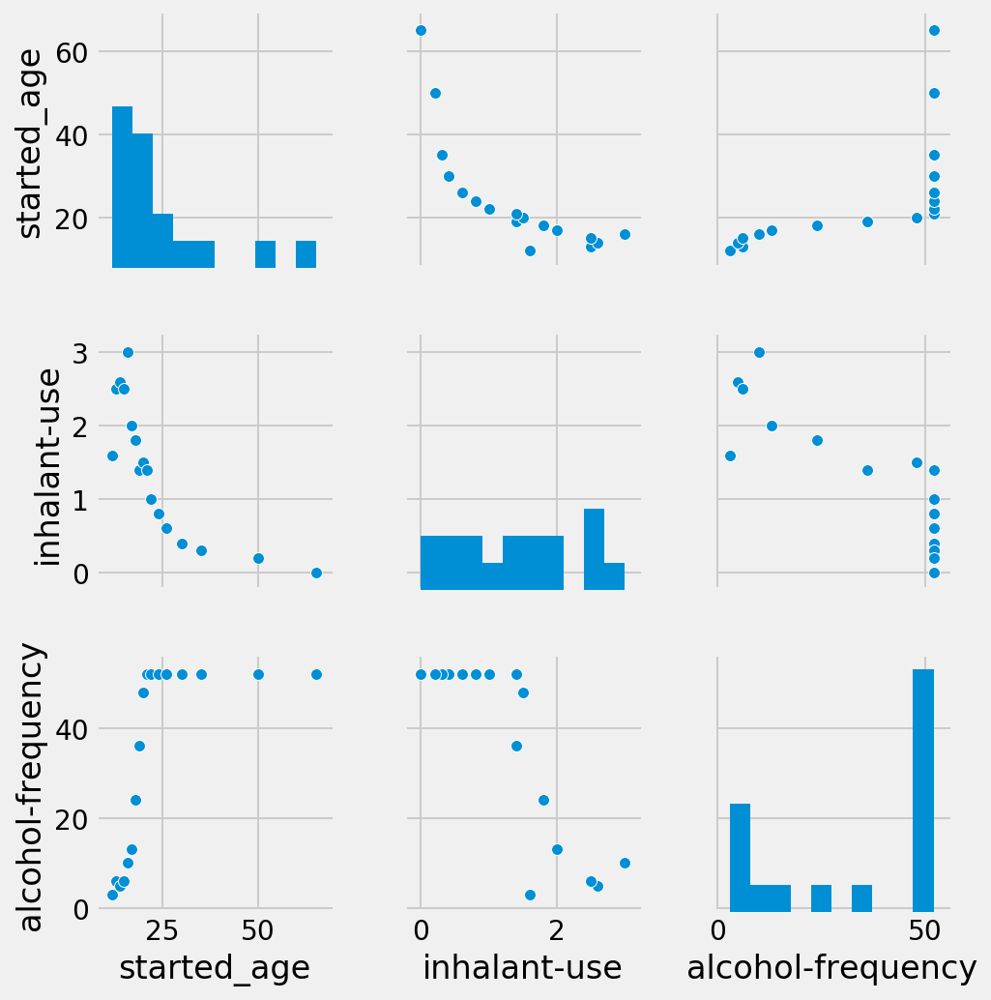

In [69]:
# The 'inhalant-use' showed high negative relationship with age, and the alcohol-frequency showed negative relationship with inhalant-use.

new_drug_negative = new_drug2[['started_age', 'inhalant-use', 'alcohol-frequency']]

sns.pairplot(new_drug_negative)

print new_drug_negative.corr(method='pearson')

** Question and deliverables**


...

In [70]:
np.mean(new_drug)

started_age                  24.529412
ended_age                    26.705882
n                          3251.058824
alcohol-use                  55.429412
alcohol-frequency            33.352941
marijuana-use                18.923529
marijuana-frequency          42.941176
cocaine-use                   2.176471
cocaine-frequency             7.411765
crack-use                     0.294118
crack-frequency              12.382353
heroin-use                    0.352941
heroin-frequency             68.970588
hallucinogen-use              3.394118
hallucinogen-frequency        8.411765
inhalant-use                  1.388235
inhalant-frequency            5.794118
pain-releiver-use             6.270588
pain-releiver-frequency      14.705882
oxycontin-use                 0.935294
oxycontin-frequency          13.941176
tranquilizer-use              2.805882
tranquilizer-frequency       11.735294
stimulant-use                 1.917647
stimulant-frequency          31.147059
meth-use                 

In [71]:
print stats.ttest_ind(new_drug['alcohol-use'], new_drug['alcohol-frequency'])
print stats.ttest_ind(new_drug['marijuana-use'], new_drug['marijuana-frequency'])
print stats.ttest_ind(new_drug['cocaine-use'], new_drug['cocaine-frequency'])
print stats.ttest_ind(new_drug['crack-use'], new_drug['crack-frequency'])
print stats.ttest_ind(new_drug['heroin-use'], new_drug['heroin-frequency'])
print stats.ttest_ind(new_drug['hallucinogen-use'], new_drug['hallucinogen-frequency'])
print stats.ttest_ind(new_drug['inhalant-use'], new_drug['inhalant-frequency'])
print stats.ttest_ind(new_drug['pain-releiver-use'], new_drug['pain-releiver-frequency'])
print stats.ttest_ind(new_drug['oxycontin-use'], new_drug['oxycontin-frequency'])
print stats.ttest_ind(new_drug['tranquilizer-use'], new_drug['tranquilizer-frequency'])
print stats.ttest_ind(new_drug['stimulant-use'], new_drug['stimulant-frequency'])
print stats.ttest_ind(new_drug['meth-use'], new_drug['meth-frequency'])
print stats.ttest_ind(new_drug['sedative-use'], new_drug['sedative-frequency'])

Ttest_indResult(statistic=2.65321305852782, pvalue=0.012308608873755542)
Ttest_indResult(statistic=-4.518923926251488, pvalue=7.99541624098301e-05)
Ttest_indResult(statistic=-2.6268034296704785, pvalue=0.013118365838314676)
Ttest_indResult(statistic=-2.8705114092418986, pvalue=0.007207876971272546)
Ttest_indResult(statistic=-4.03280620493846, pvalue=0.00031936408942836786)
Ttest_indResult(statistic=-1.355901081758801, pvalue=0.18462257321047867)
Ttest_indResult(statistic=-3.6161059816052457, pvalue=0.0010156930871447708)
Ttest_indResult(statistic=-4.562008801135155, pvalue=7.062820774930845e-05)
Ttest_indResult(statistic=-4.151649668805105, pvalue=0.00022829704229148257)
Ttest_indResult(statistic=-3.1688795969854997, pvalue=0.003358998518524245)
Ttest_indResult(statistic=-1.4015876286205255, pvalue=0.17066360955116175)
Ttest_indResult(statistic=-4.0137082685555185, pvalue=0.0003369949652118193)
Ttest_indResult(statistic=-3.1711203471155778, pvalue=0.0033394116607558147)


In [72]:
#t_stat_alcohol- the p value is smaller than the critical values. Hence, Ho is rejected.
#t_stat_marijuana- the p value is greater than the absolute critical values. Hence, Ho is accepted. 
#t_stat_cocaine- the p value is smaller than the absolute critical values. Hence, Ho is rejected.
#t_stat_crack- the p value is smaller than the absolute critical values. Hence, Ho is rejected.
#t_stat_heroin- the p value is smaller than the absolute critical values. Hence, Ho is rejected.
#t_stat_hallucinogen- the p value is smaller than the absolute critical values. Hence, Ho is rejected.
#t_stat_inhalant- the p value is greater than the absolute critical values. Hence, Ho is accepted.
#t_stat_pain_releiver- the p value is smaller than the absolute critical values. Hence, Ho is rejected.
#t_stat_oxycontin- the p value is smaller than the absolute critical values. Hence, Ho is rejected.
#t_stat_tranquilizer- the p value is smaller than the absolute critical values. Hence, Ho is rejected.
#t_stat_stimulant- the p value is smaller than the absolute critical values. Hence, Ho is rejected.
#t_stat_sedative- the p value is smaller than the absolute critical values. Hence, Ho is rejected.

Limitation of t-test 
https://www.youtube.com/watch?v=0Pd3dc1GcHc


https://www.quora.com/How-can-one-interpret-a-negative-t-value-in-a-student-test-p-value-is-very-low

**Report**



...

<img src="http://imgur.com/xDpSobf.png" style="float: left; margin: 25px 15px 0px 0px; height: 25px">

## 8. Introduction to dealing with outliers

---

Outliers are an interesting problem in statistics, in that there is not an agreed upon best way to define them. Subjectivity in selecting and analyzing data is a problem that will recur throughout the course.

1. Pull out the rate variable from the sat dataset.
2. Are there outliers in the dataset? Define, in words, how you _numerically define outliers._
3. Print out the outliers in the dataset.
4. Remove the outliers from the dataset.
5. Compare the mean, median, and standard deviation of the "cleaned" data without outliers to the original. What is different about them and why?

D:\Users\ivans\Anaconda2\lib\site-packages\ipykernel_launcher.py:6: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


,State,Rate,Verbal,Math,Difference
27,OH,26,534,439,95


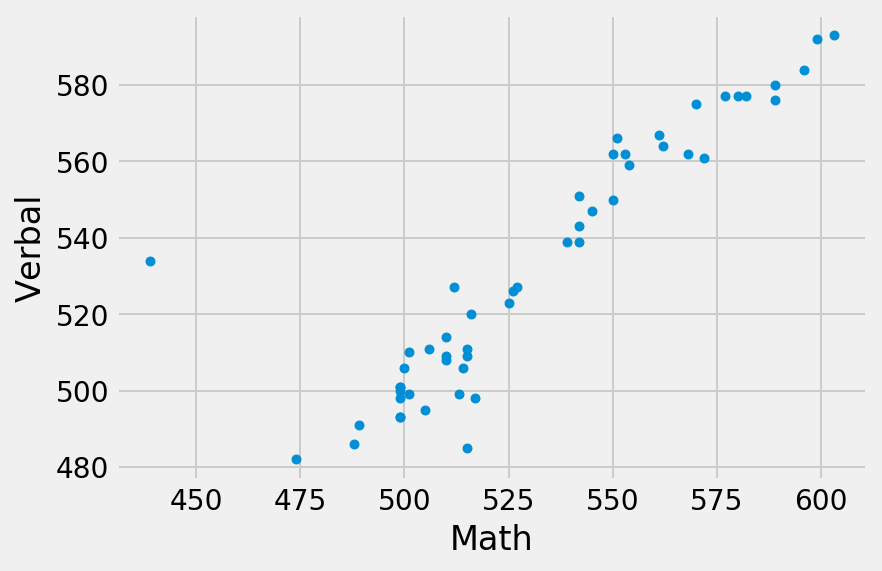

In [73]:
#plotting using scatterplot as it shows all data points, including outliers
df_sat_scores_read.plot.scatter(x='Math', y='Verbal')
#Based on the scatterplot, we could observe one outlier

#find out the outlier
df_sat_scores_read.loc[df_sat_scores_read['Verbal']<540][df_sat_scores_read['Math']<450]
#The outlier is State: OH, Verbal score: 534,  Math score: 439

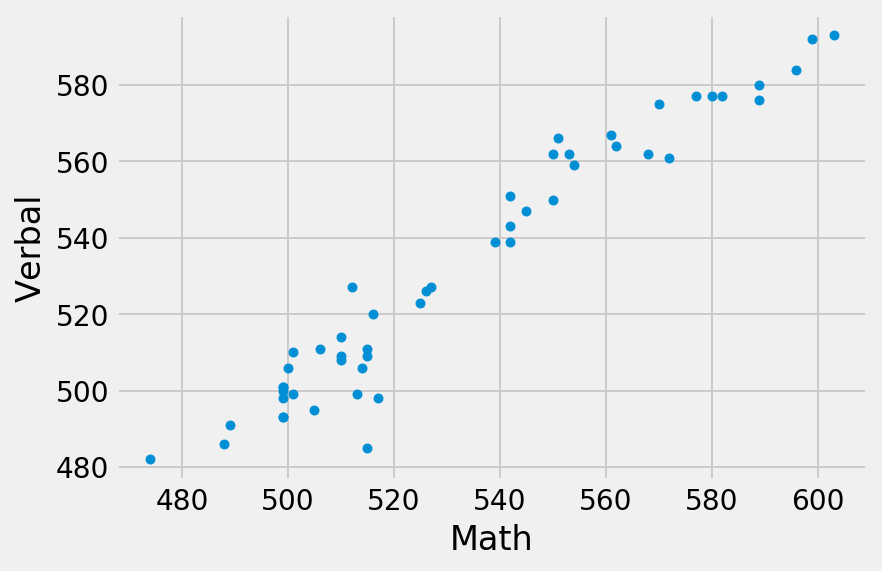

In [74]:
# remove the outlier from dataset
new_sat=df_sat_scores_read.drop([27], axis=0).reset_index()
new_sat.plot.scatter(x='Math', y='Verbal')

In [75]:
#Compare the mean, median, and standard deviation of the "cleaned" data without outliers to the original
print('Verbal')
print("original verbal mean: {}, verbal mean without outlier: {}".format(df_sat_scores_read['Verbal'].mean(), new_sat['Verbal'].mean()))
print("original verbal median: {}, verbal median without outlier: {}".format(df_sat_scores_read['Verbal'].median(), new_sat['Verbal'].median()))
print("original verbal stdev: {}, verbal stdev without outlier: {}".format(df_sat_scores_read['Verbal'].std(), new_sat['Verbal'].std()))
print("")
print('Math')
print("original math mean: {}, math mean without outlier: {}".format(df_sat_scores_read['Math'].mean(), new_sat['Math'].mean()))
print("original math median: {}, math median without outlier: {}".format(df_sat_scores_read['Math'].median(), new_sat['Math'].median()))
print("original math stdev: {}, math stdev without outlier: {}".format(df_sat_scores_read['Math'].std(), new_sat['Math'].std()))

Verbal
original verbal mean: 532.019230769, verbal mean without outlier: 531.980392157
original verbal median: 526.5, verbal median without outlier: 526.0
original verbal stdev: 33.2362254438, verbal stdev without outlier: 33.5657505181

Math
original math mean: 531.5, math mean without outlier: 533.31372549
original math median: 521.0, math median without outlier: 525.0
original math stdev: 36.0149750989, math stdev without outlier: 33.8901107676


<img src="http://imgur.com/GCAf1UX.png" style="float: left; margin: 25px 15px 0px 0px; height: 25px">

### 9. Percentile scoring and spearman rank correlation

---

### 9.1 Calculate the spearman correlation of sat `Verbal` and `Math`

1. How does the spearman correlation compare to the pearson correlation? 
2. Describe clearly in words the process of calculating the spearman rank correlation.
  - Hint: the word "rank" is in the name of the process for a reason!


1. The Pearson correlation evaluates the linear relationship between two continuous variables while the Spearman correlation evaluates the monotonic relationship between two continuous or ordinal variables.

2. Spearman’s Rank correlation coefficient is a technique which can be used to summarise the strength and direction (negative or positive) of a relationship between two variables. The difference in the ranks would be squred to remove the negative values, then squared difference divided by (n^3-n). The greater the difference, the smaller the correlation.

### 9.2 Percentile scoring

Look up percentile scoring of data. In other words, the conversion of numeric data to their equivalent percentile scores.

http://docs.scipy.org/doc/numpy-dev/reference/generated/numpy.percentile.html

http://docs.scipy.org/doc/scipy/reference/generated/scipy.stats.percentileofscore.html

1. Convert `Rate` to percentiles in the sat scores as a new column.
2. Show the percentile of California in `Rate`.
3. How is percentile related to the spearman rank correlation?

In [76]:
df_sat_scores_read['Rate (%)'] = df_sat_scores_read['Rate'].map(lambda x: stats.percentileofscore(df_sat_scores_read['Rate'], x))

In [77]:
df_sat_scores_read[df_sat_scores_read['State'] == 'CA']

,State,Rate,Verbal,Math,Difference,Rate (%)
23,CA,51,498,517,-19,56.730769


### 9.3 Percentiles and outliers

1. Why might percentile scoring be useful for dealing with outliers?
2. Plot the distribution of a variable of your choice from the drug use dataset.
3. Plot the same variable but percentile scored.
4. Describe the effect, visually, of coverting raw scores to percentile.

In [81]:
new_drug['alcohol-use (%)'] = new_drug['alcohol-use'].map(lambda x: stats.percentileofscore(new_drug['alcohol-use'], x))

In [83]:
new_drug.head()

,started_age,ended_age,n,alcohol-use,alcohol-frequency,marijuana-use,marijuana-frequency,cocaine-use,cocaine-frequency,crack-use,...,tranquilizer-use,tranquilizer-frequency,stimulant-use,stimulant-frequency,meth-use,meth-frequency,sedative-use,sedative-frequency,ach (%),alcohol-use (%)
0,12,12,2798,3.9,3.0,1.1,4.0,0.1,5.0,0.0,...,0.2,52.0,0.2,2.0,0.0,0.0,0.2,13.0,100.000000,5.882353
1,13,13,2757,8.5,6.0,3.4,15.0,0.1,1.0,0.0,...,0.3,25.5,0.3,4.0,0.1,5.0,0.1,19.0,98.076923,11.764706
2,14,14,2792,18.1,5.0,8.7,24.0,0.1,5.5,0.0,...,0.9,5.0,0.8,12.0,0.1,24.0,0.2,16.5,96.153846,17.647059
3,15,15,2956,29.2,6.0,14.5,25.0,0.5,4.0,0.1,...,2.0,4.5,1.5,6.0,0.3,10.5,0.4,30.0,94.230769,23.529412
4,16,16,3058,40.1,10.0,22.5,30.0,1.0,7.0,0.0,...,2.4,11.0,1.8,9.5,0.3,36.0,0.2,3.0,92.307692,29.411765


In [80]:
#Too late already, brain not working anymore. Please don't fail me. ^.^!!!